# Борьба с оттоком клиентов "Телеком"

<div style="border:solid Chocolate 2px; padding: 40px">

## Описание проекта

Оператор связи намерен бороться с оттоком клиентов. Для того, чтобы адресно предложить клиентам более выгодные условия, необходимо выявить клиентов, которые намереваются покинуть компанию. Наша задача — проанализировать собранные компанией данные, обучить модель для прогноза оттока клиентов, дать рекомендации для бизнеса.

<b>Описание услуг</b>

Оператор предоставляет два основных типа услуг: стационарную телефонную связь и интернет. Телефон можно подключить к нескольким линиям одновременно. Интернет можно подключить через телефонную линию DSL или оптоволоконный кабель. Также абонентам доступен ряд дополнительных услуг: антивирус, блокировка опасных сайтов, выделенная линия технической поддержки, облачное хранилище файлов для резервного копирования данных, стриминговое телевидение и каталог фильмов.

<b>Описание данных</b>
    
Данные хранятся в нескольких таблицах в базе данных PostgreSQL:

* contract — информация о договорах;
* personal — персональные данные клиентов;
* internet — информация об интернет-услугах;
* phone — информация об услугах телефонии.

Информация о договорах актуальна на 1 февраля 2020.

In [1]:
import pandas as pd
import numpy as np
from numpy.random import RandomState
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns

from sqlalchemy import create_engine

import datetime
from datetime import datetime, timedelta
import time
import random

RANDOM_STATE = 19032024


from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.utils import shuffle
from sklearn.preprocessing import StandardScaler, OneHotEncoder, OrdinalEncoder
from sklearn.metrics import f1_score, precision_score, recall_score, roc_curve, roc_auc_score, \
                            make_scorer, classification_report, accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.compose import make_column_transformer
from sklearn.dummy import DummyClassifier

from catboost import CatBoostClassifier, Pool

import lightgbm as lgb
from lightgbm import LGBMClassifier

import math
from math import ceil

import torch
import torch.nn as nn
import torch.optim as optim

from skorch import NeuralNetClassifier

import shap

import warnings
warnings.filterwarnings("ignore")

C:\Users\Katya\AppData\Roaming\Python\Python311\site-packages\pandas\core\arrays\masked.py:60: UserWarning: Pandas requires version '1.3.6' or newer of 'bottleneck' (version '1.3.5' currently installed).
  from pandas.core import (


In [2]:
db_config = {
'user': 'praktikum_student',# имя пользователя,
'pwd': 'Sdf4$2;d-d30pp',# пароль,
'host': 'rc1b-wcoijxj3yxfsf3fs.mdb.yandexcloud.net',
'port': 6432,# порт подключения,
'db': 'data-science-final'# название базы данных,
}

connection_string = 'postgresql://{}:{}@{}:{}/{}'.format(
    db_config['user'],
    db_config['pwd'],
    db_config['host'],
    db_config['port'],
    db_config['db'],
)

In [3]:
engine = create_engine(connection_string) 

## Загрузка данных

Загрузим данные и посмотрим общую информацию.

### contract

In [4]:
query = '''
SELECT *
FROM telecom.contract;
'''

with engine.connect() as conn:
    contract = pd.read_sql(
        sql=query,
        con=conn.connection
    )
contract.head()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,4472-LVYGI,2020-02-01,None,Two year,Yes,Bank transfer (automatic),52.55,NaN
1,3115-CZMZD,2020-02-01,None,Two year,No,Mailed check,20.25,NaN
2,3668-QPYBK,2018-08-09,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15
3,5709-LVOEQ,2020-02-01,None,Two year,No,Mailed check,80.85,NaN
4,9237-HQITU,2019-01-26,2019-11-01,Month-to-month,Yes,Electronic check,70.70,151.65


In [5]:
contract.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           1869 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7032 non-null   float64
dtypes: float64(2), object(6)
memory usage: 440.3+ KB


Для использования библиотеки Profile приведём данные 'BeginDate', 'EndDate' к формату datetime.

In [6]:
contract[['BeginDate', 'EndDate']].dtypes

BeginDate    object
EndDate      object
dtype: object

In [7]:
contract['BeginDate'] = pd.to_datetime(contract['BeginDate'],format= "%Y/%m/%d")
contract['EndDate'] = pd.to_datetime(contract['EndDate'],format= "%Y/%m/%d")

In [8]:
contract[['BeginDate', 'EndDate']].dtypes

BeginDate    datetime64[ns]
EndDate      datetime64[ns]
dtype: object

In [9]:
profile_contract = ProfileReport(
    contract,
    title= 'Отчет по contract',
    minimal = True)
profile_contract

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Вывод**

Датафрейм contract содержит 7043 строк, 8 столбцов. В столбце EndDate только 1869 объектов, то есть 73.5% пропусков. В `TotalCharges` 0.2% пропусков. В остальных данных пропусков нет.

Есть разные типы данных:

`MonthlyCharges` и `TotalCharges` - численный тип;

`BeginDate` и `EndDate` - мы привели к типу datetime.

Даты заключения договоров в `BeginDate` начинаются с 2019-10-01. последняя дата заключения договора - 2020-01-01, что соответсвует дате выгрузки датасета.

Все идентификаторы пользователей `customerID` уникальны. Дубликатов нет. `EndDate` содержит дату завершения контракта с пользователем. Пропуски в столбце `EndDate` означают, что контракт с пользователем не завершён. На базе этого признака мы и составим целевой признак. 

### personal

In [10]:
query = '''
SELECT *
FROM telecom.personal;
'''

with engine.connect() as conn:
    personal = pd.read_sql(
        sql=query,
        con=conn.connection
    )
personal.head()

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No


In [11]:
personal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


In [12]:
profile_personal = ProfileReport(
    personal,
    title= 'Отчет по personal',
    minimal = True)
profile_personal

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Вывод**

Датафрейм personal содержит 7043 строк, 5 столбцов. Пропусков в данных нет.

Есть разные типы данных:

`SeniorCitizen` - численный тип;

Остальные - текстового типа.

Все идентификаторы пользователей `customerID` уникальны. Дубликатов нет.

### internet

In [13]:
query = '''
SELECT *
FROM telecom.internet;
'''

with engine.connect() as conn:
    internet = pd.read_sql(
        sql=query,
        con=conn.connection
    )
internet.head()

,c1,c2,c3,c4,c5,c6,c7,c8
0,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
1,7590-VHVEG,DSL,No,Yes,No,No,No,No
2,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
3,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
4,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No


Назначим первую строку в качестве имени столбцов.

In [14]:
internet.columns = internet.iloc[0]
internet = internet.drop(index=0)
internet.head()

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
1,7590-VHVEG,DSL,No,Yes,No,No,No,No
2,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
3,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
4,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
5,9237-HQITU,Fiber optic,No,No,No,No,No,No


In [15]:
internet_description = ProfileReport(
    internet,
    title= 'Отчет по internet',
    minimal = True)
internet_description

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Вывод**

Датафрейм internet содержит 5517 строк, 8 столбцов. Пропусков в данных нет. Все текстового типа. Все идентификаторы пользователей `customerID` уникальны. Дубликатов нет. Строк меньше чем в personal и contract. Это говорит о том, что не все пользователи пользуются услугами интернета.

### phone

In [16]:
query = '''
SELECT *
FROM telecom.phone;
'''

with engine.connect() as conn:
    phone = pd.read_sql(
        sql=query,
        con=conn.connection
    )
phone.head()

,c1,c2
0,customerID,MultipleLines
1,5575-GNVDE,No
2,3668-QPYBK,No
3,9237-HQITU,No
4,9305-CDSKC,Yes


In [17]:
phone.columns = phone.iloc[0]
phone = phone.drop(index=0)
phone.head()

,customerID,MultipleLines
1,5575-GNVDE,No
2,3668-QPYBK,No
3,9237-HQITU,No
4,9305-CDSKC,Yes
5,1452-KIOVK,Yes


In [18]:
phone_description = ProfileReport(
    phone,
    title= 'Отчет по phone',
    minimal = True)
phone_description

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

**Вывод**

Датафрейм phone содержит 6361 строк, 2 столбца. Пропусков в данных нет. Все идентификаторы пользователей `customerID` уникальны. Дубликатов нет. Строк меньше чем в personal и contract. Это говорит о том, что не все пользователи пользуются услугами телефонии.

***
<h3> Вывод о загрузке данных <a class="tocSkip"> </h3>

**Датафрейм `contract`** содержит 7043 строк, 8 столбцов. В столбце EndDate только 1869 объектов, то есть 73.5% пропусков. В `TotalCharges` 0.2% пропусков. В остальных данных пропусков нет.

* Есть разные типы данных:

    `MonthlyCharges` и `TotalCharges` - численный тип;

    `BeginDate` и `EndDate` - мы привели к типу datetime.

* Даты заключения договоров в `BeginDate` начинаются с 2019-10-01. последняя дата заключения договора - 2020-01-01, что соответсвует дате выгрузки датасета.

* Все идентификаторы пользователей `customerID` уникальны. Дубликатов нет. `EndDate` содержит дату завершения контракта с пользователем. Пропуски в столбце `EndDate` означают, что контракт с пользователем не завершён. На базе этого признака мы и составим целевой признак.



**Датафрейм `personal`** содержит 7043 строк, 5 столбцов. Пропусков в данных нет.

* Есть разные типы данных:

    `SeniorCitizen` - численный тип;

    Остальные - текстового типа.

* Все идентификаторы пользователей `customerID` уникальны. Дубликатов нет.


**Датафрейм `internet`** содержит 5517 строк, 8 столбцов. Пропусков в данных нет.

* Все текстового типа.
* Все идентификаторы пользователей `customerID` уникальны.
* Дубликатов нет.
* Строк меньше чем в personal и contract. Это говорит о том, что не все пользователи пользуются услугами интернета.


**Датафрейм `phone`** содержит 6361 строк, 2 столбца. 
* Пропусков в данных нет. 
* Все идентификаторы пользователей `customerID` уникальны. 
* Дубликатов нет. 
* Строк меньше чем в personal и contract. Это говорит о том, что не все пользователи пользуются услугами телефонии.

## Объединение датафреймов

Объединим данные в датафрейм. Обратим внимание на то, что не все позьзователи подключены и к телефонии, и к интернету. Поэтому при объединении зададим параметр how='outer', чтобы не потерять данные.

In [19]:
pd.set_option('display.max_columns', 25)

In [20]:
data = (contract.merge(personal, on='customerID')
                      .merge(internet, on='customerID', how='outer')
                      .merge(phone, on='customerID', how='outer'))
data.head()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines
0,0002-ORFBO,2019-02-08,NaT,One year,Yes,Mailed check,65.6,593.30,Female,0,Yes,Yes,DSL,No,Yes,No,Yes,Yes,No,No
1,0003-MKNFE,2018-11-13,NaT,Month-to-month,No,Mailed check,59.9,542.40,Male,0,No,No,DSL,No,No,No,No,No,Yes,Yes
2,0004-TLHLJ,2019-04-16,2020-01-01,Month-to-month,Yes,Electronic check,73.9,280.85,Male,0,No,No,Fiber optic,No,No,Yes,No,No,No,No
3,0011-IGKFF,2019-04-12,2020-01-01,Month-to-month,Yes,Electronic check,98.0,1237.85,Male,1,Yes,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,No
4,0013-EXCHZ,2019-03-17,2019-12-01,Month-to-month,Yes,Mailed check,83.9,267.40,Female,1,Yes,No,Fiber optic,No,No,No,Yes,Yes,No,No


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   customerID        7043 non-null   object        
 1   BeginDate         7043 non-null   datetime64[ns]
 2   EndDate           1869 non-null   datetime64[ns]
 3   Type              7043 non-null   object        
 4   PaperlessBilling  7043 non-null   object        
 5   PaymentMethod     7043 non-null   object        
 6   MonthlyCharges    7043 non-null   float64       
 7   TotalCharges      7032 non-null   float64       
 8   gender            7043 non-null   object        
 9   SeniorCitizen     7043 non-null   int64         
 10  Partner           7043 non-null   object        
 11  Dependents        7043 non-null   object        
 12  InternetService   5517 non-null   object        
 13  OnlineSecurity    5517 non-null   object        
 14  OnlineBackup      5517 n

Выделим целевой признак. Если дата окончания контракта указана, значит контракт завершён.

In [22]:
data['EndDate'] = data['EndDate'].fillna('Not')

In [23]:
def get_target(row):
    if row['EndDate'] == 'Not':
        target = 0
    else:
        target = 1
    return target

In [24]:
data['target'] = data.apply(lambda x: get_target(x), axis=1)

In [25]:
data['target'].unique()

array([0, 1], dtype=int64)

Теперь создадим новый признак: длительность контракта. Для тех контрактов, которые не завершены посчитаем длительность относительно даты выгрузки датасета.

In [26]:
actual_date = datetime.strptime('2020-02-01','%Y-%m-%d')
data['EndDate'] = data['EndDate'].replace(['Not'], actual_date)
data['duration'] = (data['EndDate'] - data['BeginDate']).dt.days

Создадим признаки год начала контракта, месяц начала контракта

In [27]:
### Создадим признаки год начала контракта, месяц начала контракта
data['begin_year'] = data['BeginDate'].apply(lambda x: x.year)
data['begin_month'] = data['BeginDate'].apply(lambda x: x.month)

In [28]:
data.head()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines,target,duration,begin_year,begin_month
0,0002-ORFBO,2019-02-08,2020-02-01,One year,Yes,Mailed check,65.6,593.30,Female,0,Yes,Yes,DSL,No,Yes,No,Yes,Yes,No,No,0,358,2019,2
1,0003-MKNFE,2018-11-13,2020-02-01,Month-to-month,No,Mailed check,59.9,542.40,Male,0,No,No,DSL,No,No,No,No,No,Yes,Yes,0,445,2018,11
2,0004-TLHLJ,2019-04-16,2020-01-01,Month-to-month,Yes,Electronic check,73.9,280.85,Male,0,No,No,Fiber optic,No,No,Yes,No,No,No,No,1,260,2019,4
3,0011-IGKFF,2019-04-12,2020-01-01,Month-to-month,Yes,Electronic check,98.0,1237.85,Male,1,Yes,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,No,1,264,2019,4
4,0013-EXCHZ,2019-03-17,2019-12-01,Month-to-month,Yes,Mailed check,83.9,267.40,Female,1,Yes,No,Fiber optic,No,No,No,Yes,Yes,No,No,1,259,2019,3


Переведём id в качестве индекса.

In [29]:
data = data.set_index('customerID')

### Заполнение пропусков

Посмотрим на пропуски в `TotalCharges`

In [30]:
data[data['TotalCharges'].isna()]

,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines,target,duration,begin_year,begin_month
customerID,,,,,,,,,,,,,,,,,,,,,,,
1371-DWPAZ,2020-02-01,2020-02-01,Two year,No,Credit card (automatic),56.05,NaN,Female,0,Yes,Yes,DSL,Yes,Yes,Yes,Yes,Yes,No,NaN,0,0,2020,2
2520-SGTTA,2020-02-01,2020-02-01,Two year,No,Mailed check,20.00,NaN,Female,0,Yes,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,0,0,2020,2
2775-SEFEE,2020-02-01,2020-02-01,Two year,Yes,Bank transfer (automatic),61.90,NaN,Male,0,No,Yes,DSL,Yes,Yes,No,Yes,No,No,Yes,0,0,2020,2
2923-ARZLG,2020-02-01,2020-02-01,One year,Yes,Mailed check,19.70,NaN,Male,0,Yes,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,0,0,2020,2
3115-CZMZD,2020-02-01,2020-02-01,Two year,No,Mailed check,20.25,NaN,Male,0,No,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,No,0,0,2020,2
3213-VVOLG,2020-02-01,2020-02-01,Two year,No,Mailed check,25.35,NaN,Male,0,Yes,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,0,0,2020,2
4075-WKNIU,2020-02-01,2020-02-01,Two year,No,Mailed check,73.35,NaN,Female,0,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Yes,0,0,2020,2
4367-NUYAO,2020-02-01,2020-02-01,Two year,No,Mailed check,25.75,NaN,Male,0,Yes,Yes,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Yes,0,0,2020,2
4472-LVYGI,2020-02-01,2020-02-01,Two year,Yes,Bank transfer (automatic),52.55,NaN,Female,0,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,NaN,0,0,2020,2


У нас 11 строк с пропусками в `TotalCharges`. Судя по дате, это контракты, которые были заключены в день выгрузки данных. Поэтому данных об общей оплате нет. Можем заполнить эти пропуски нулём.

In [31]:
data['TotalCharges'] = data['TotalCharges'].fillna(0)

Проверим остальные пропуски

In [32]:
def pass_value_barh(df):
    try:
        (
            (df.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), rot = 0, color = 'skyblue', legend = False, grid=True, fontsize = 16)
            .set_title('Процент пропущенных значений' + "\n", fontsize = 22)
        );    
    except:
        print('пропусков не осталось :) или произошла ошибка в первой части функции ')

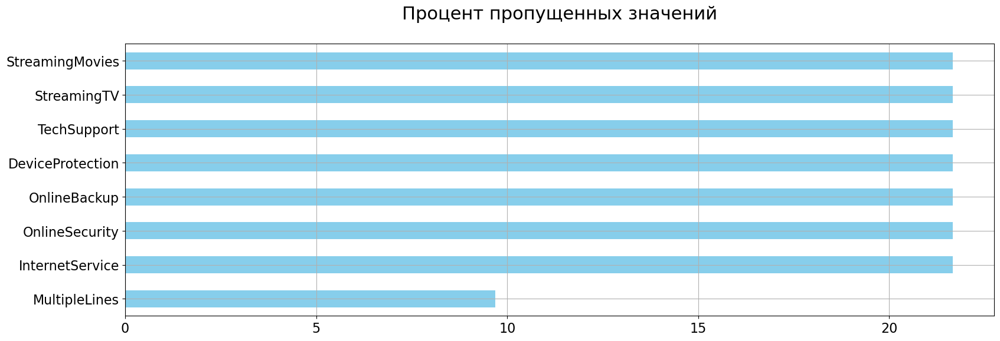

In [33]:
pass_value_barh(data)

In [34]:
data[data['OnlineBackup'].isna() & data['MultipleLines'].isna()]

,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines,target,duration,begin_year,begin_month
customerID,,,,,,,,,,,,,,,,,,,,,,,


Видим, что остальные пропуски в данных касаются интернет услуг и отдельно телефонии. И нет таких клиентов, которые не были подключены хотя бы к олной из двух услуг: к интернету или телефонии. Что логично. То есть пропуски есть для тех абонентов, которые просто не используют данные сервисы. Заполним таким пропуски значением 'unconnected'.

In [35]:
data = data.fillna('unconnected')

Поскольку SeniorCitizen это по сути категориальный признак, переведём его в другой тип данных.

In [36]:
data['SeniorCitizen'] = data['SeniorCitizen'].astype('bool').astype('str')

Напишем функцию для разделения данных на категориальные и численные.

In [37]:
data.dtypes

BeginDate           datetime64[ns]
EndDate             datetime64[ns]
Type                        object
PaperlessBilling            object
PaymentMethod               object
MonthlyCharges             float64
TotalCharges               float64
gender                      object
SeniorCitizen               object
Partner                     object
Dependents                  object
InternetService             object
OnlineSecurity              object
OnlineBackup                object
DeviceProtection            object
TechSupport                 object
StreamingTV                 object
StreamingMovies             object
MultipleLines               object
target                       int64
duration                     int64
begin_year                   int64
begin_month                  int64
dtype: object

In [38]:
def sep_col(df):
    num_col = df.select_dtypes('number').columns.tolist()
    cat_col = df.select_dtypes('object').columns.tolist()
    date_col = df.select_dtypes(exclude=['number', 'object']).columns.tolist()

    print('cat_col', cat_col)
    print('num_col', num_col)
    print('date_col', date_col)
    return cat_col, num_col, date_col

cat_col, num_col, date_col = sep_col(data)
num_col.remove('target')

cat_col ['Type', 'PaperlessBilling', 'PaymentMethod', 'gender', 'SeniorCitizen', 'Partner', 'Dependents', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'MultipleLines']
num_col ['MonthlyCharges', 'TotalCharges', 'target', 'duration', 'begin_year', 'begin_month']
date_col ['BeginDate', 'EndDate']


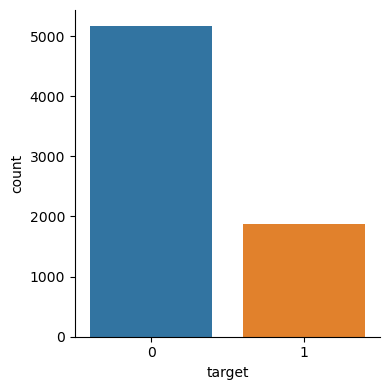

In [39]:
ax = sns.catplot(data=data,
                 x='target', 
                 kind = 'count', height=4, aspect=1, 
                 palette='tab10')
plt.show()

Хорошо виден дисбаланс классов. Стоит учитывать этот момент при построении модели.

***
<h3> Вывод <a class="tocSkip"> </h3>

* Мы объединили все датафремы по ID пользователя и выделили целевой признак.
* Создали новые признаки: год начала контракта, месяц начала контракта, длительность контракта. Для тех контрактов, которые не были завершены мы посчитали длительность относительно даты выгрузки датасета.
* Мы сохранили все строки при объединении, поэтому получили много пропусков для тех клиетов, которые пользовались только одним сервисом: либо интеренетом, либо телефонией. Такие пропуски мы заполнили значением 'unconnected'.
* Пропуски в `TotalCharges` есть для тех контрактов, которые были заключены в день выгрузки данных. Их мы заполнили 0.
* Выяснили, что есть дисбаланс классов. Учтём это при построении модели.

## Исследовательский анализ

In [40]:
profile_data = ProfileReport(
    data,
    title= 'Отчет по объединённому датафрейму',
    minimal = True)
profile_data

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Посмотрим внимательнее распределение категориальны признаков.

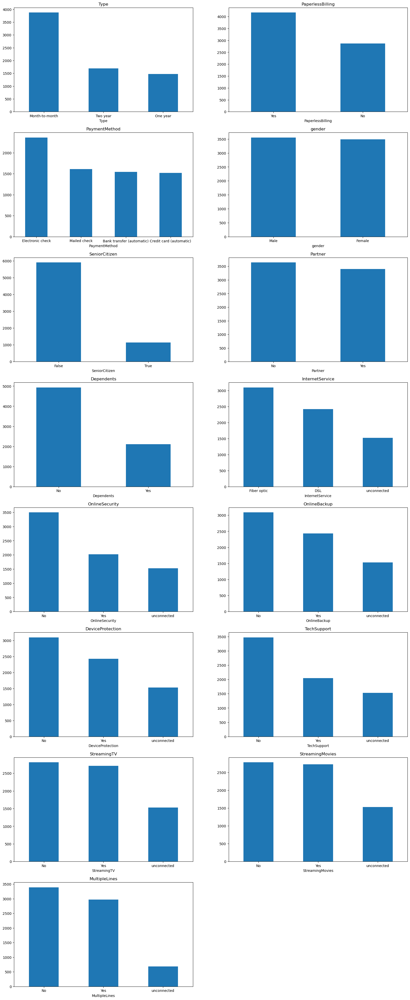

In [41]:
cols = 2
rows = int(np.ceil(len(cat_col) / cols))

plt.figure(figsize=(20, 50))

for idx, column in enumerate(cat_col):
    ax = plt.subplot(rows, cols, idx + 1)
    
    data[column].value_counts().plot(
        kind='bar', 
        title=column, 
        ax=ax,
        rot=0)
        
plt.show()

* Количество клиентов мужчин и женщин практически одинаковое. Большинство клиентов не являются пенсионерами. Почти одинаковое количество как женатых, так и не женатых клиентов. Клиентов, у которых есть дети почти в два раза меньше, чем тех, у кого детей нет.

* Клиентов, которые пользуются подключением к интернету через оптоволокно чуть больше чем DSL. Доля тех, кто не подключили услугу блокировки опасных сайтов, антивирус и выделенной линией технической поддержки чуть больше чем тех, кто подключил эти услуги.

* Примерно одинаковое количество клиентов подключены к нескольким или только к одной телефонным линиям.

* Чаще всего клиенты предпочитают оплачивать услуги каждый месяц и через электронный чек. Другие типы оплаты встречаются с одинаковой частотой.


* В признаке 'MonthlyCharges' - ежемесячный платёж, есть три пика. Очень много значений около 20, то есть низкий платёж. Также есть пик около 80.

* Видно, что распределение 'TotalCharges' - общие расходы абонента смещенно влево, то есть количество клиентов, которые остаются достаточно долго  не много.

Посмотрим внимательнее распределение численных признаков.

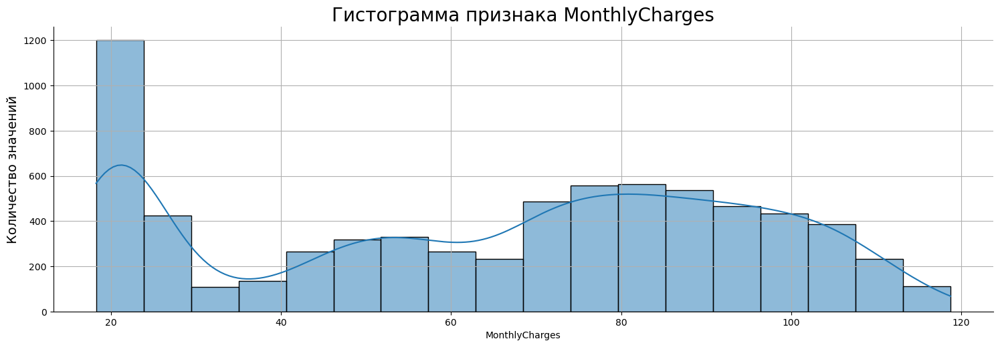

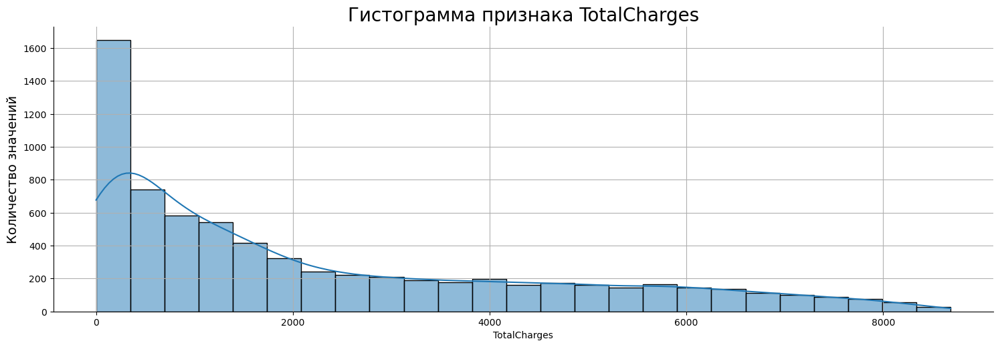

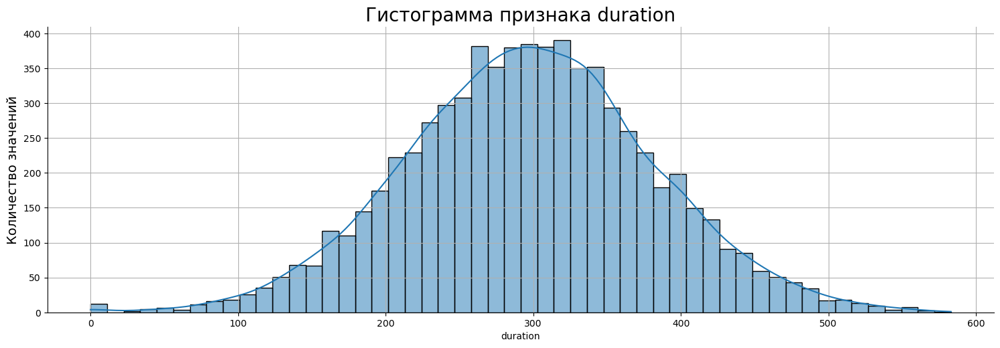

In [42]:
for i in ['MonthlyCharges', 'TotalCharges', 'duration']:
    sns.displot(data, x=i, kde=True, height= 5 , aspect= 3)
    plt.grid(True)
    plt.title(f'Гистограмма признака {i}', fontsize=20)
    plt.ylabel('Количество значений', fontsize=14)
    plt.show()

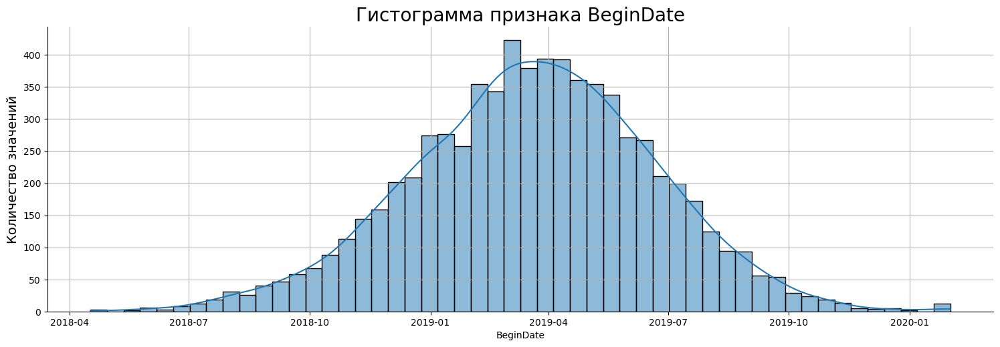

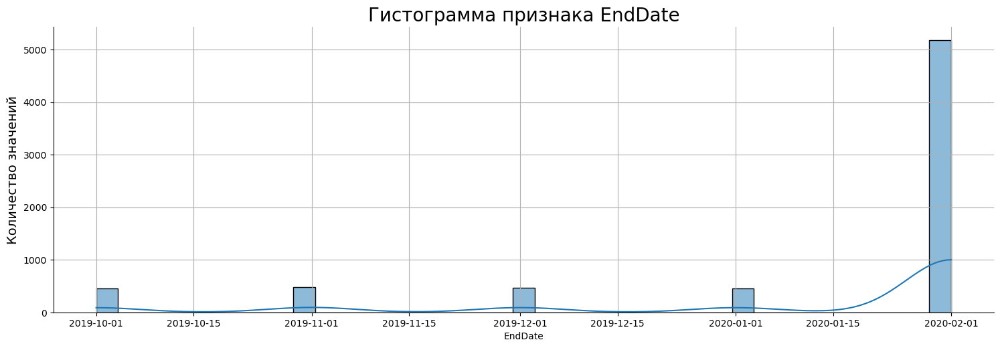

In [43]:
for i in date_col:
    sns.displot(data, x=i, kde=True, height= 5 , aspect= 3)
    plt.grid(True)
    plt.title(f'Гистограмма признака {i}', fontsize=20)
    plt.ylabel('Количество значений', fontsize=14)
    plt.show()

Можно заметить, что заключали контракты по любым дням, а вот расторгали только в первое число месяца. Не будем обращать внимание на последний всплеск значений EndDate 2020-02-01, так как этим значением мы сами заполнили пропуски в данном столбце.

Также колчество заключенных контрактов со временем снижаеться, тогда как количество закрытых договоров примерно одинаковое. Стоит отметить что в датасете представлены договоры, заключенные начиная с 04-2018, тогда как первая дата расторжения договора 01-10-2019. Это происходит тогда когда количество новых договоров уже на спаде.

В целом нормальное распределение в BeginDate выглядит странно. Похоже, на графике мы видим некий всплеск новых договоров. Пик приходится на  март-апрель 2019-го. Вероятно это следствие какой-нибудь акции.

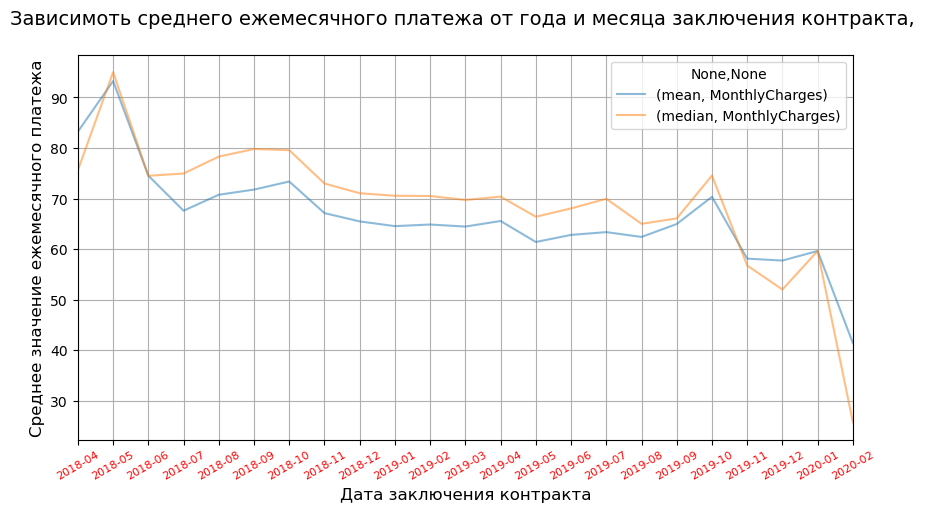

In [44]:
fig, ax = plt.subplots()
position_month = list(data["BeginDate"].dt.to_period("M").unique())
(
    data
    .pivot_table(index=data["BeginDate"].dt.to_period("M"), values='MonthlyCharges', aggfunc=['mean', 'median'])
    .plot(grid=(True), style='-', alpha=0.5, figsize=(10, 5), ax=ax)
)

plt.xlabel('Дата заключения контракта', fontsize=12)
plt.ylabel('Среднее значение ежемесячного платежа', fontsize=12)
plt.title('Зависимоть среднего ежемесячного платежа от года и месяца заключения контракта, \n', fontsize=14)
plt.legend=True
ax.set_xticks(position_month)
ax.set_xticklabels(list(data["BeginDate"].dt.to_period("M").unique()), size=8, c='red')
plt.xticks(rotation=30)
plt.show()

Хорошо видно, что среднее значение ежемесячного платежа для новых договоров снижается.

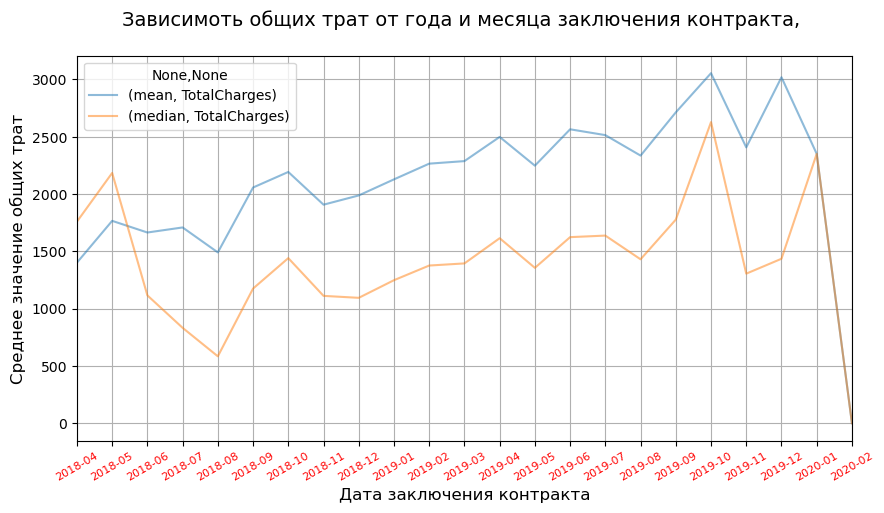

In [45]:
fig, ax = plt.subplots()
position_month = list(data["BeginDate"].dt.to_period("M").unique())
(
    data
    .pivot_table(index=data["BeginDate"].dt.to_period("M"), values='TotalCharges', aggfunc=['mean', 'median'])
    .plot(grid=(True), style='-', alpha=0.5, figsize=(10, 5), ax=ax)
)

plt.xlabel('Дата заключения контракта', fontsize=12)
plt.ylabel('Среднее значение общих трат', fontsize=12)
plt.title('Зависимоть общих трат от года и месяца заключения контракта, \n', fontsize=14)
plt.legend=True
ax.set_xticks(position_month)
ax.set_xticklabels(list(data["BeginDate"].dt.to_period("M").unique()), size=8, c='red')
plt.xticks(rotation=30)
plt.show()

Видна тенденция к росту общих платежей. Это объясняется тем, что приток новых клиентов очень невелик, и сумма платежей старых клиентов имеет большой вес в среднем значении общих трат.  В начале и конце графика мы видим скачки медианы и среднего значения. Скорее всего это связано с небольшим количеством значений, когда каждое значение или выброс сильно влияет на среднее.

Посмотрим количество ушедших клиентов и долю ушедших и оставшихся клиентов в зависимости от года заключения договора.

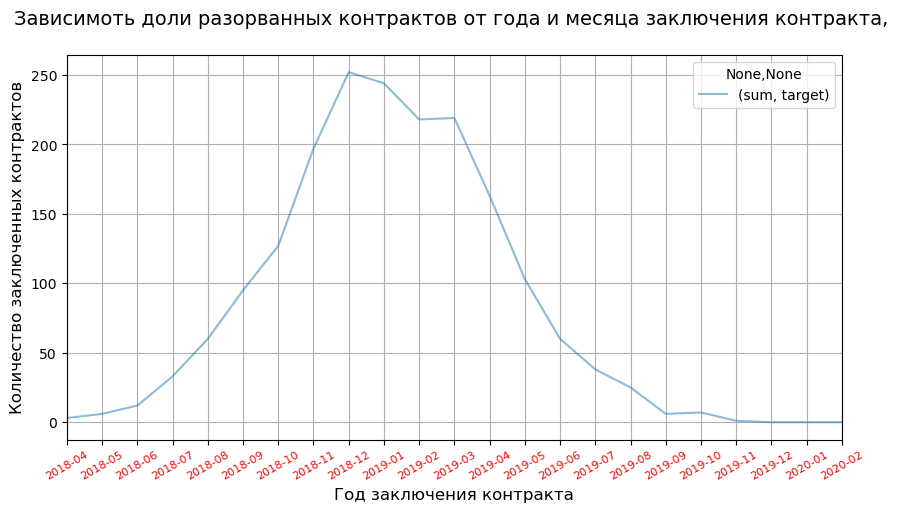

In [46]:
fig, ax = plt.subplots()
position_month = list(data["BeginDate"].dt.to_period("M").unique())
(
    data
    .pivot_table(index=data["BeginDate"].dt.to_period("M"), values='target', aggfunc=['sum'])
    .plot(grid=(True), style='-', alpha=0.5, figsize=(10, 5), ax=ax)
)

plt.xlabel('Год заключения контракта', fontsize=12)
plt.ylabel('Количество заключенных контрактов', fontsize=12)
plt.title('Зависимоть доли разорванных контрактов от года и месяца заключения контракта, \n', fontsize=14)
plt.legend=True
ax.set_xticks(position_month)
ax.set_xticklabels(list(data["BeginDate"].dt.to_period("M").unique()), size=8, c='red')
plt.xticks(rotation=30)
plt.show()

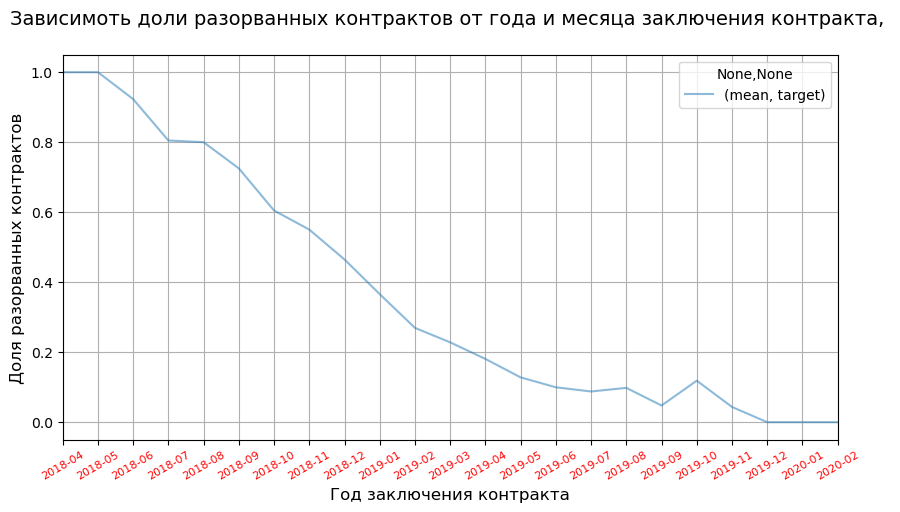

In [47]:
fig, ax = plt.subplots()
position_month = list(data["BeginDate"].dt.to_period("M").unique())
(
    data
    .pivot_table(index=data["BeginDate"].dt.to_period("M"), values='target', aggfunc=['mean'])
    .plot(grid=(True), style='-', alpha=0.5, figsize=(10, 5), ax=ax)
)

plt.xlabel('Год заключения контракта', fontsize=12)
plt.ylabel('Доля разорванных контрактов', fontsize=12)
plt.title('Зависимоть доли разорванных контрактов от года и месяца заключения контракта, \n', fontsize=14)
plt.legend=True
ax.set_xticks(position_month)
ax.set_xticklabels(list(data["BeginDate"].dt.to_period("M").unique()), size=8, c='red')
plt.xticks(rotation=30)
plt.show()

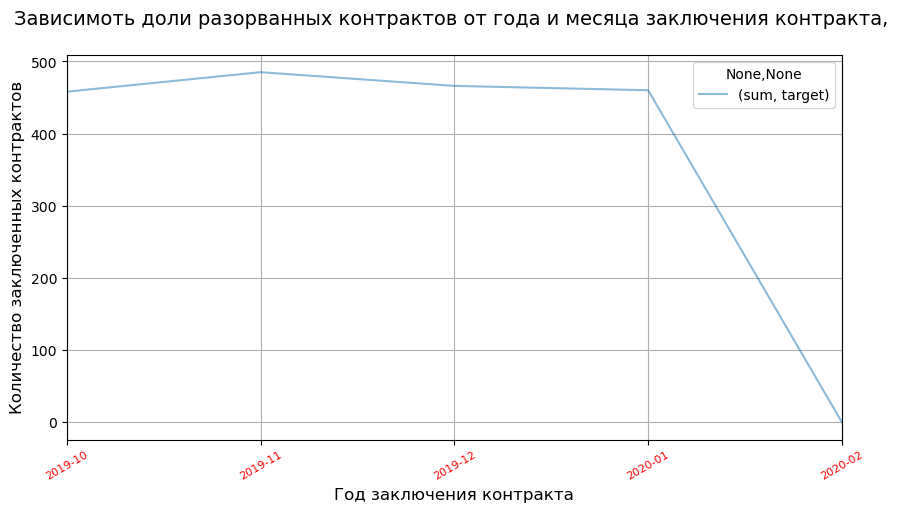

In [48]:
fig, ax = plt.subplots()
position_month = list(data["EndDate"].dt.to_period("M").unique())
(
    data
    .pivot_table(index=data["EndDate"].dt.to_period("M"), values='target', aggfunc=['sum'])
    .plot(grid=(True), style='-', alpha=0.5, figsize=(10, 5), ax=ax)
)

plt.xlabel('Год заключения контракта', fontsize=12)
plt.ylabel('Количество заключенных контрактов', fontsize=12)
plt.title('Зависимоть доли разорванных контрактов от года и месяца заключения контракта, \n', fontsize=14)
plt.legend=True
ax.set_xticks(position_month)
ax.set_xticklabels(list(data["EndDate"].dt.to_period("M").unique()), size=8, c='red')
plt.xticks(rotation=30)
plt.show()

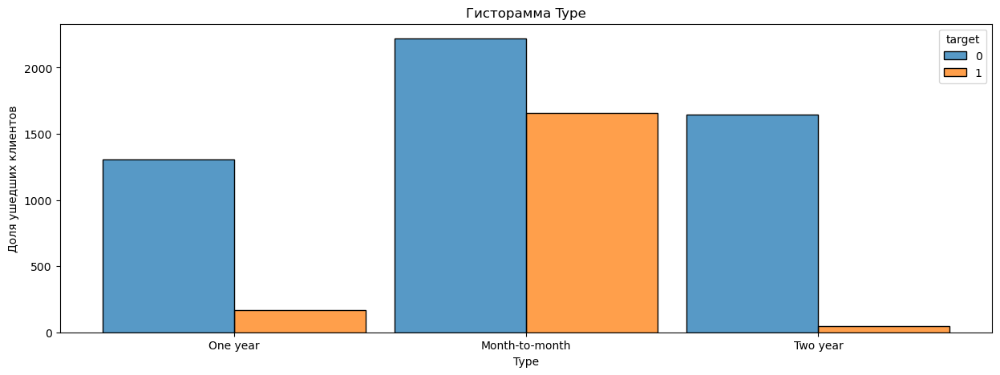

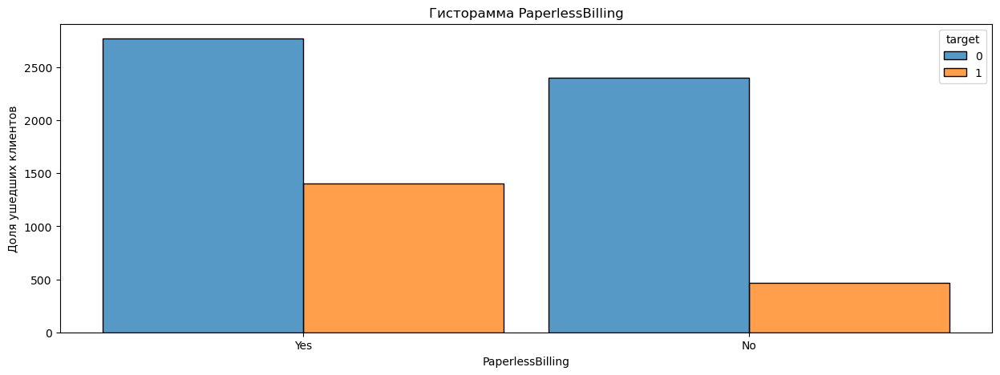

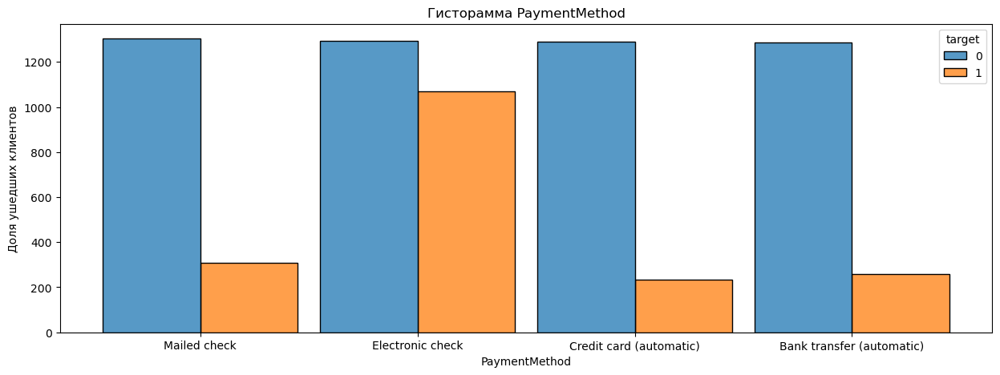

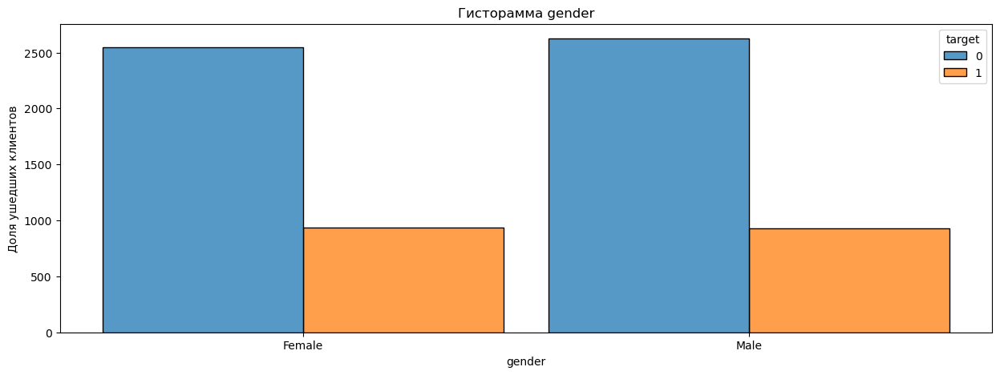

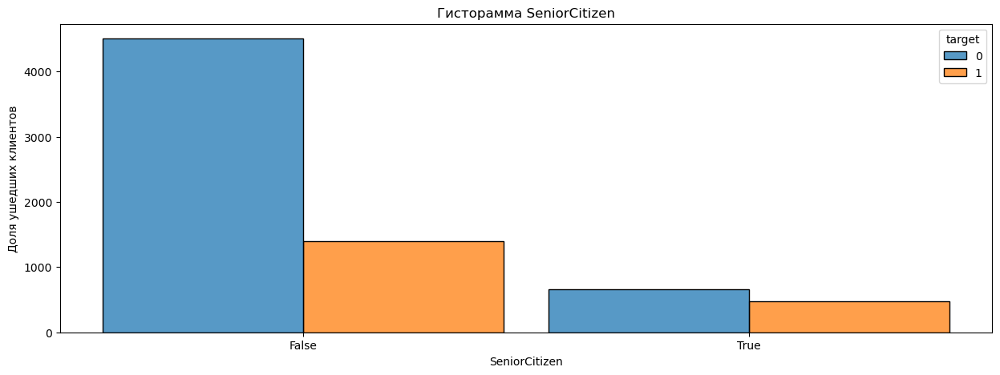

...

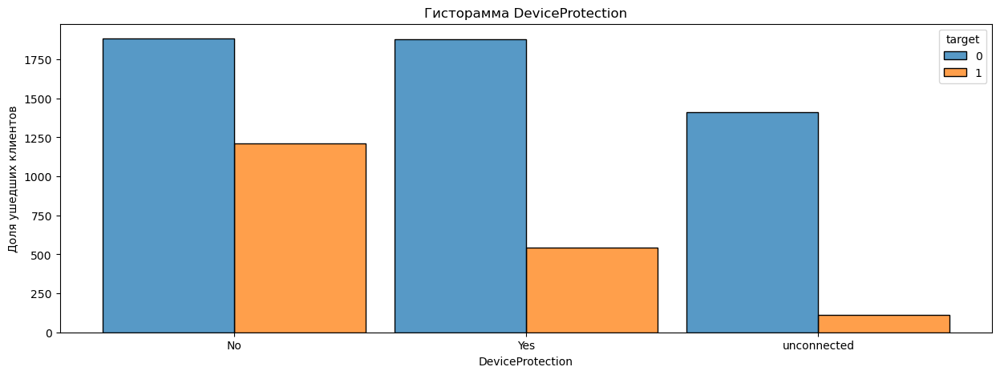

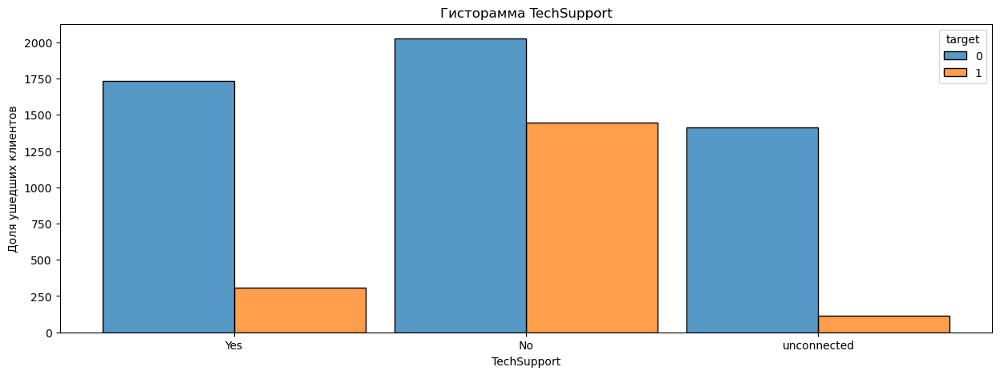

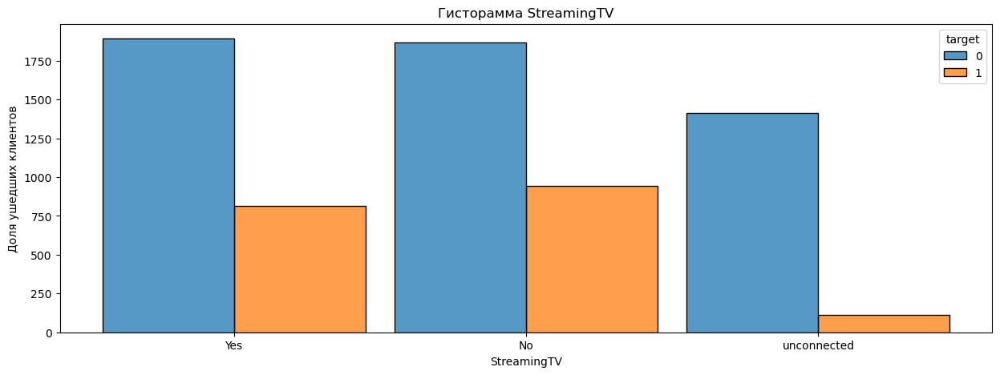

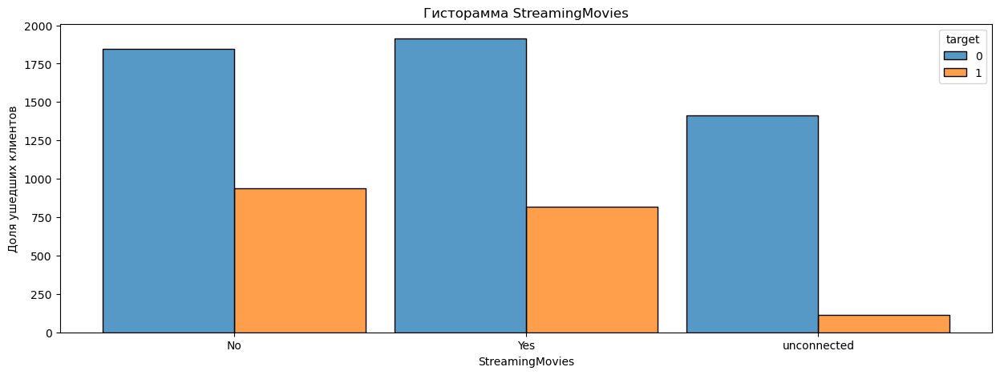

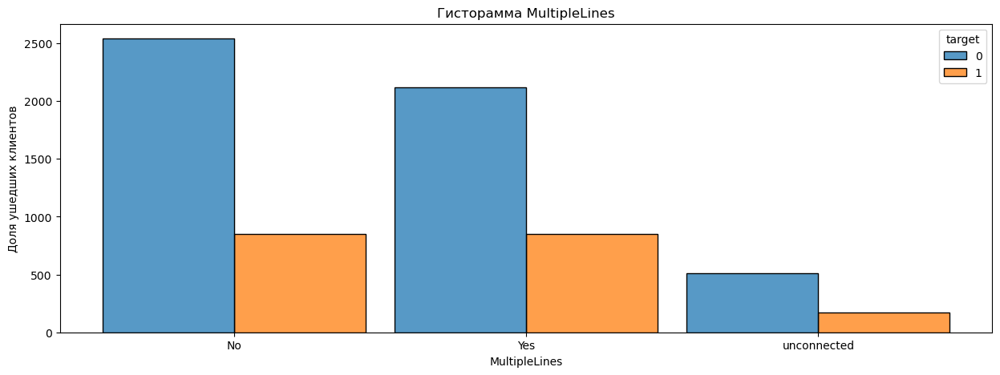

In [49]:
for i in cat_col:
    plt.figure(figsize=(15,5))
    sns.histplot(data=data,x=i,hue='target', multiple="dodge", shrink=.9)
    plt.ylabel('Доля ушедших клиентов')
    plt.xlabel(i)
    plt.title(f'Гисторамма {i}')
    plt.show();

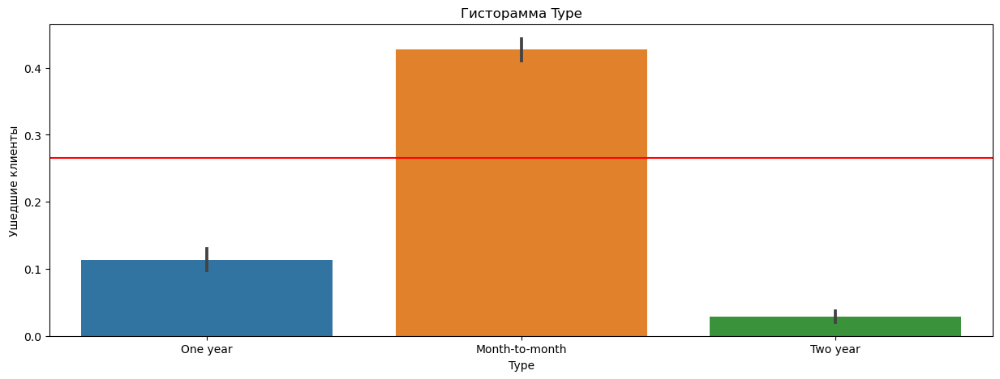

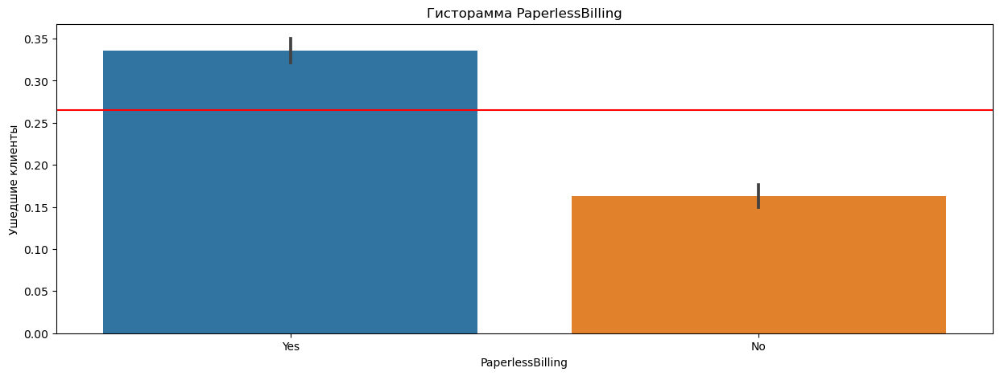

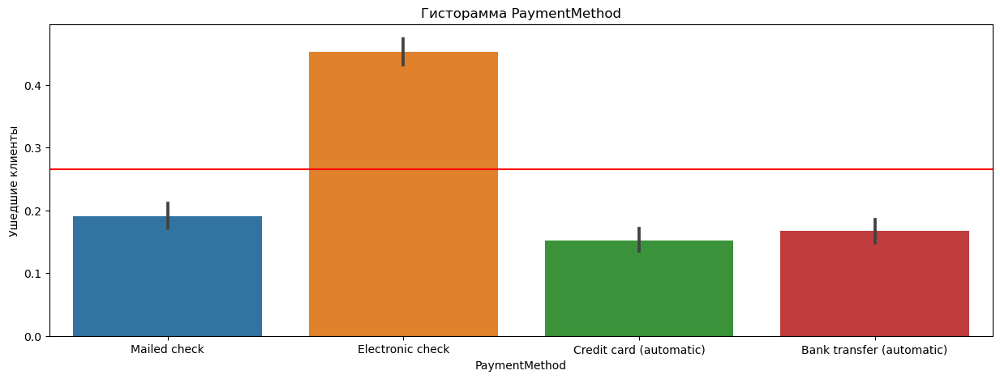

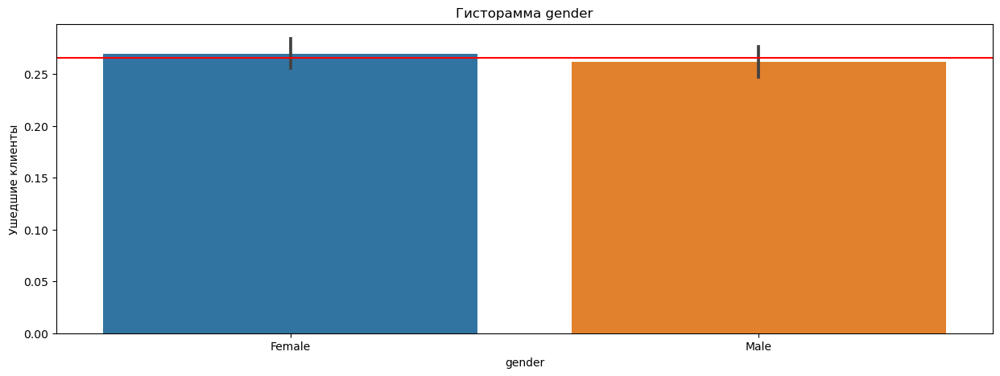

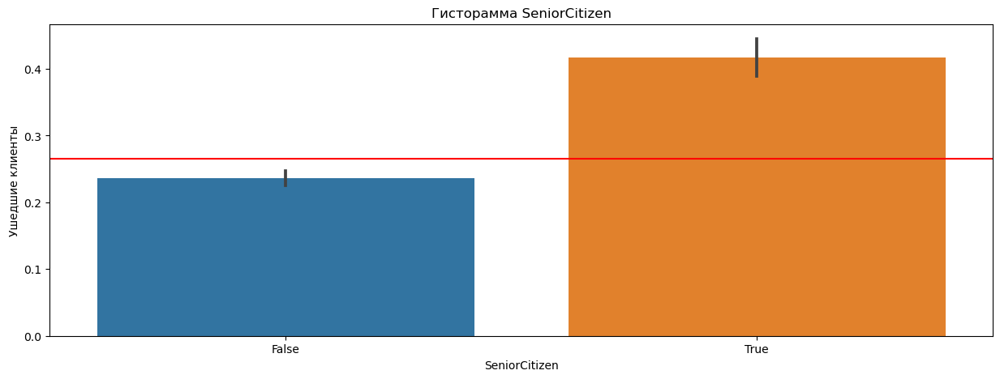

...

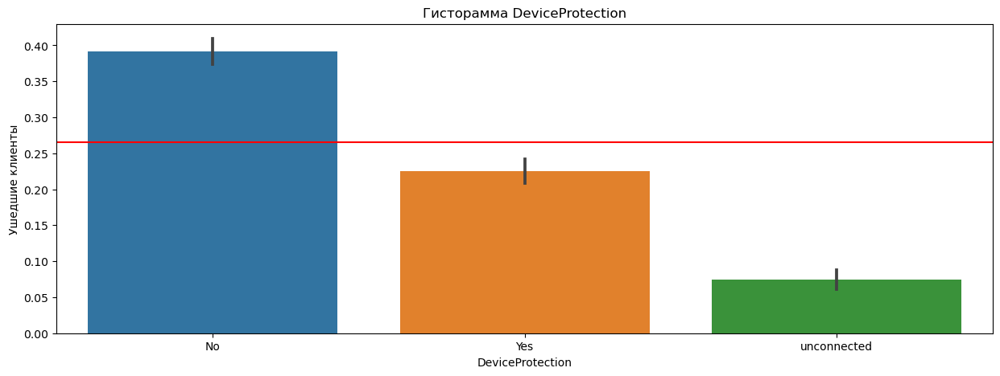

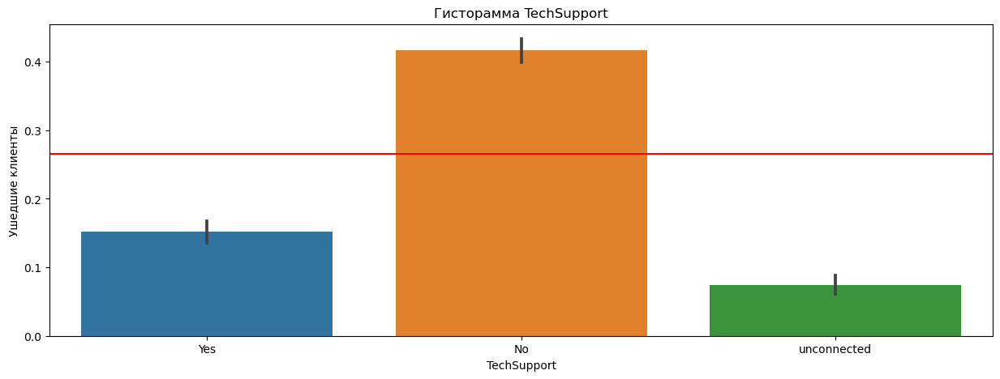

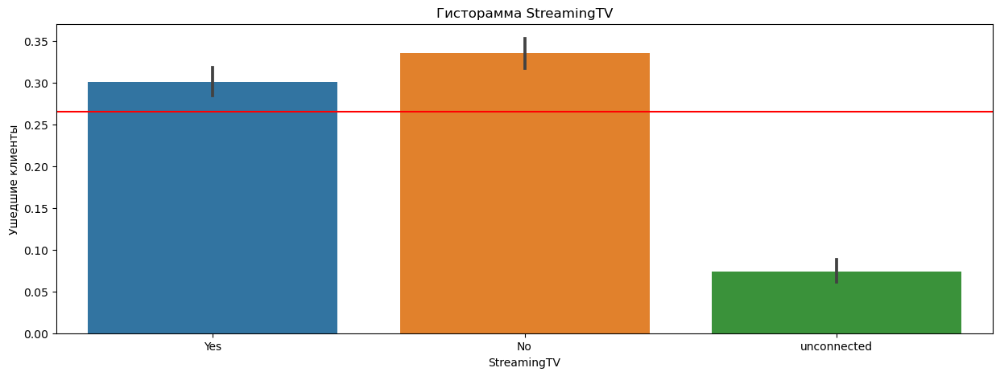

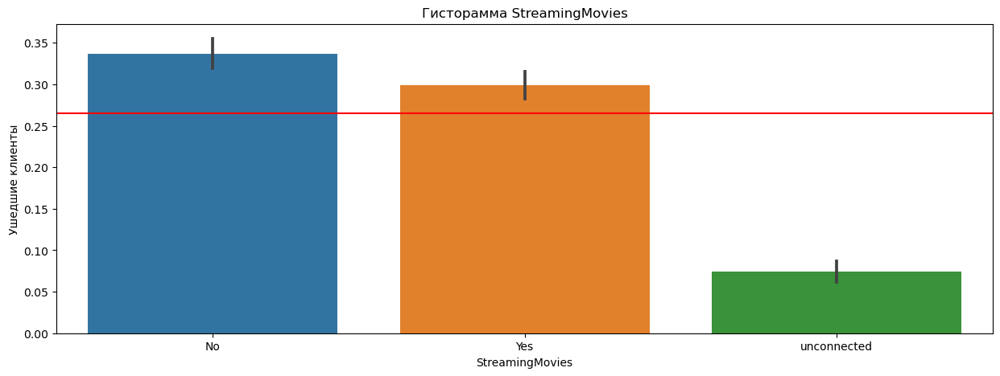

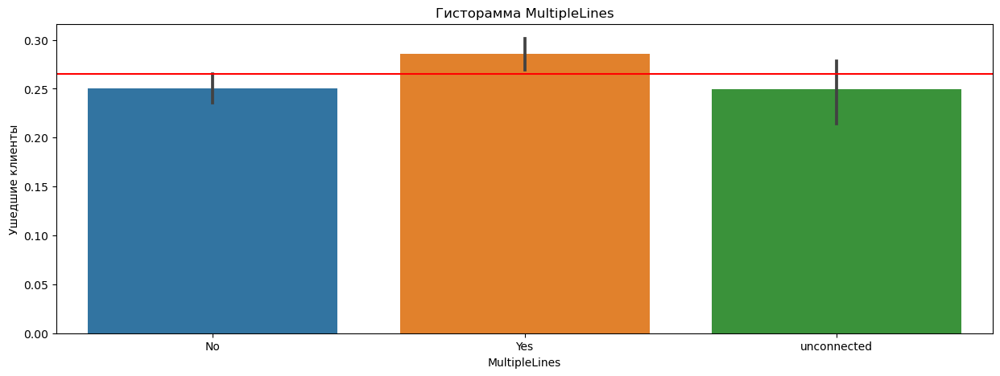

In [50]:
for i in cat_col:
    plt.figure(figsize=(15,5))
    sns.barplot(data=data,
                x=i,
                y='target')
    plt.ylabel('Ушедшие клиенты')
    plt.xlabel(i)
    plt.title(f'Гисторамма {i}')
    plt.axhline(y=data['target'].mean(), color='red')
    plt.show();

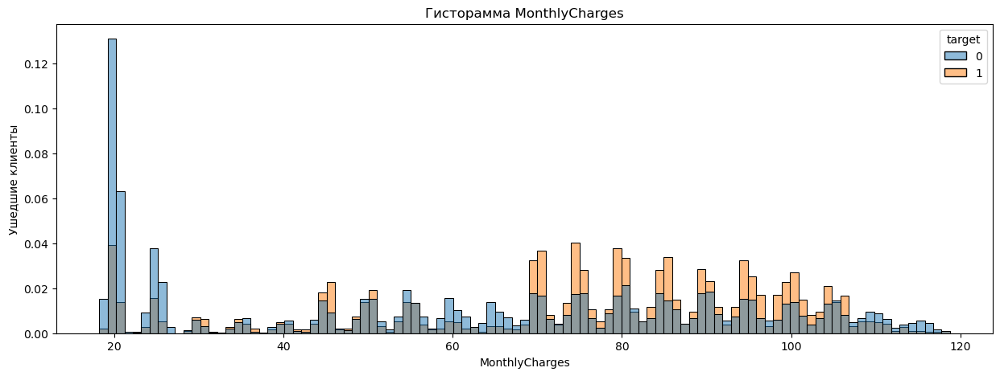

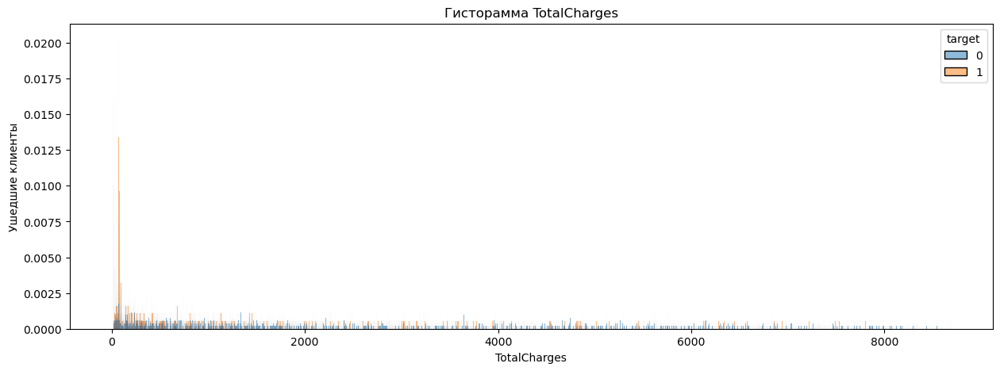

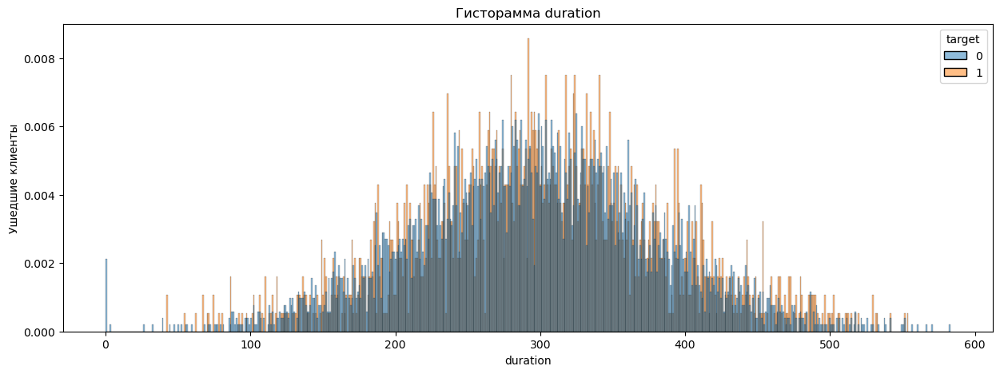

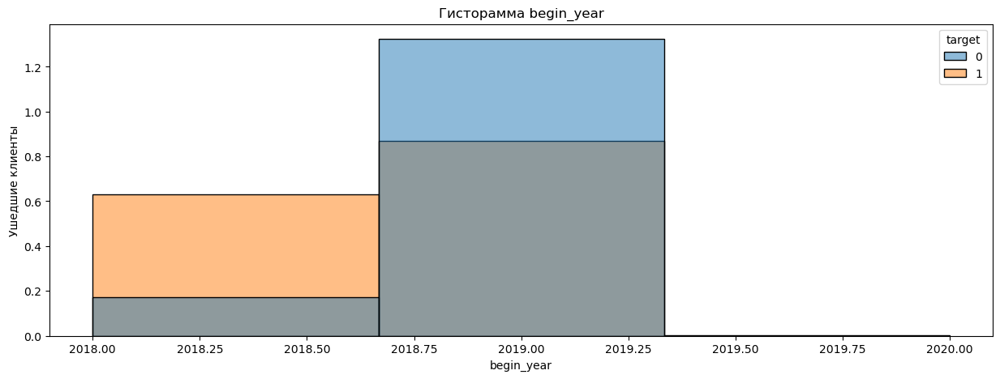

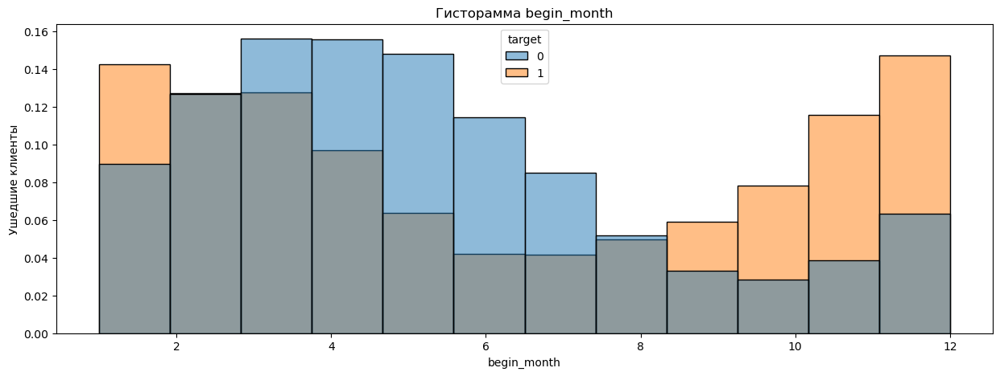

In [51]:
for i in num_col:
    plt.figure(figsize=(15,5))
    sns.histplot(data=data,
                 x=i,
                 hue='target', 
                 stat='density', 
                 common_norm=False, 
                 bins= int(max(data[i]) - min(data[i]) + 1))
    plt.ylabel('Ушедшие клиенты')
    plt.xlabel(i)
    plt.title(f'Гисторамма {i}')
    plt.show();

Видим, что больше всего клиентов разорвали договоры среди тех, кто заключил его в декабре 2018. Вспомним, что пик заключения новых договоров пришелся на март-апрель того же года. А вот доля разорванных контрактов снижается, то есть более новые контракты в среднем разрывают реже.

Посмотрим доли расторжения договоров для категориальных признаков.

,target
Type,
Month-to-month,0.427097
One year,0.112695
Two year,0.028319


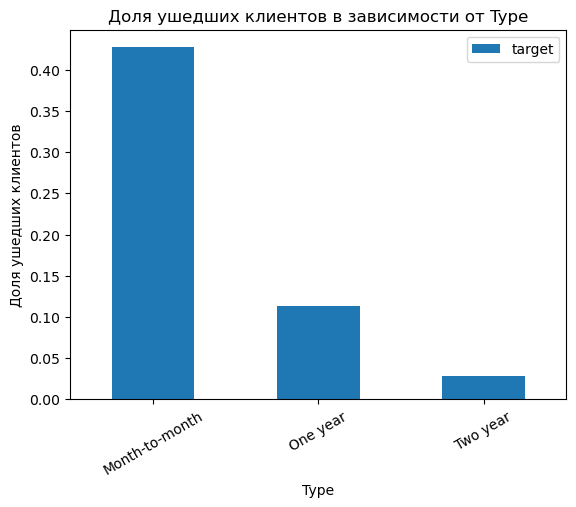

,target
PaperlessBilling,
No,0.163301
Yes,0.335651


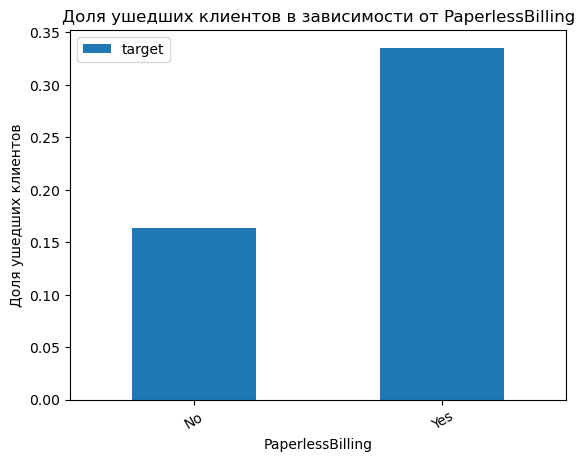

,target
PaymentMethod,
Bank transfer (automatic),0.167098
Credit card (automatic),0.152431
Electronic check,0.452854
Mailed check,0.191067


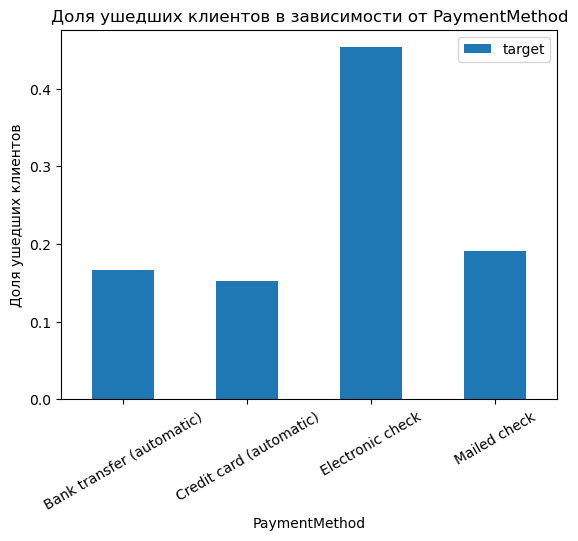

,target
gender,
Female,0.269209
Male,0.261603


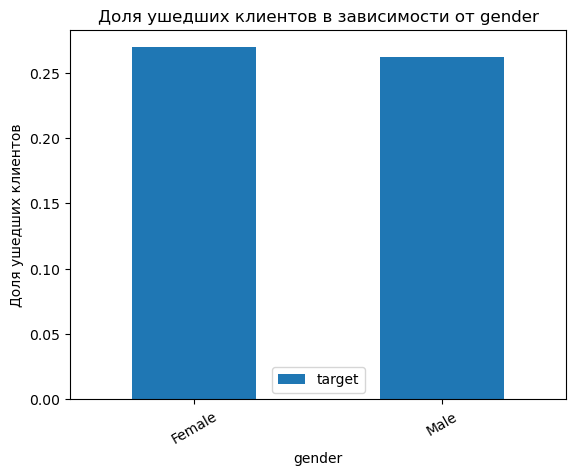

,target
SeniorCitizen,
False,0.236062
True,0.416813


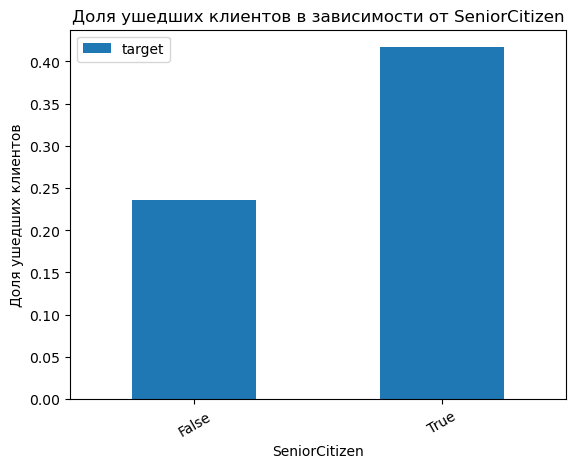

,target
Partner,
No,0.329580
Yes,0.196649


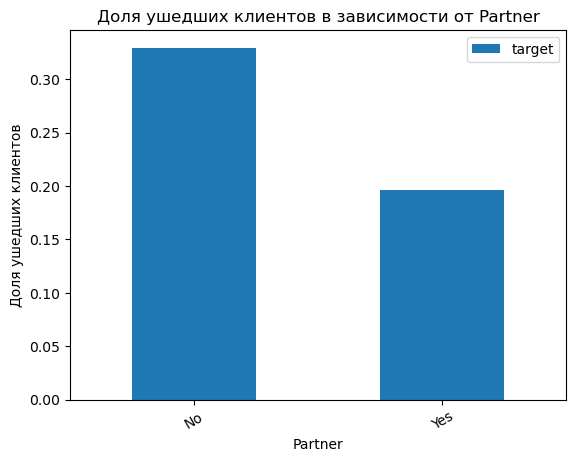

,target
Dependents,
No,0.312791
Yes,0.154502


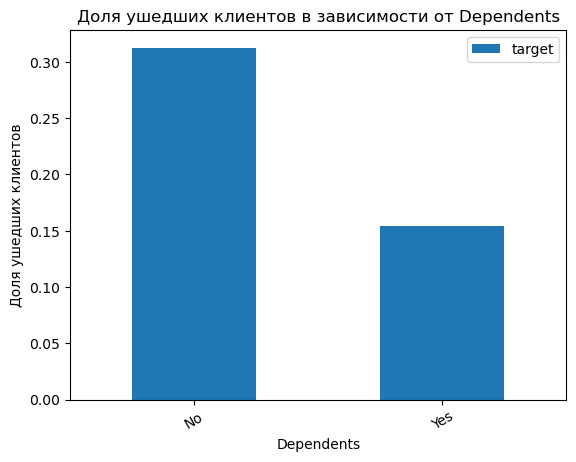

,target
InternetService,
DSL,0.189591
Fiber optic,0.418928
unconnected,0.074050


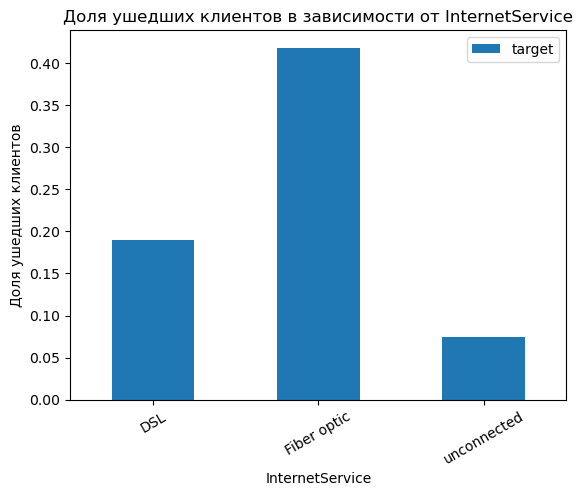

,target
OnlineSecurity,
No,0.417667
Yes,0.146112
unconnected,0.074050


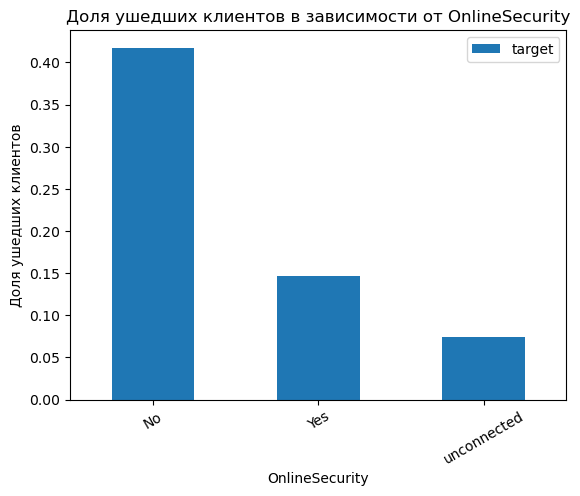

,target
OnlineBackup,
No,0.399288
Yes,0.215315
unconnected,0.074050


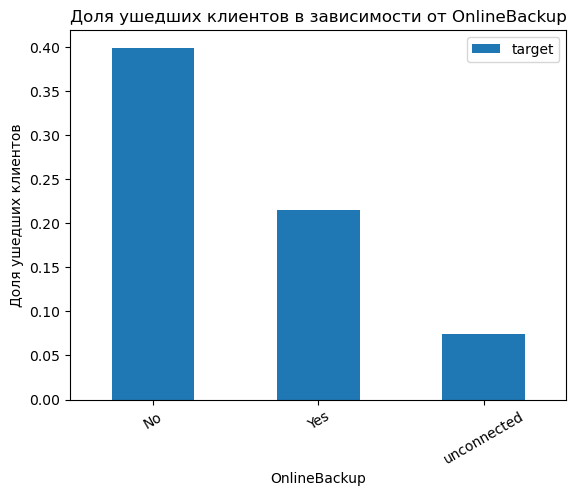

,target
DeviceProtection,
No,0.391276
Yes,0.225021
unconnected,0.074050


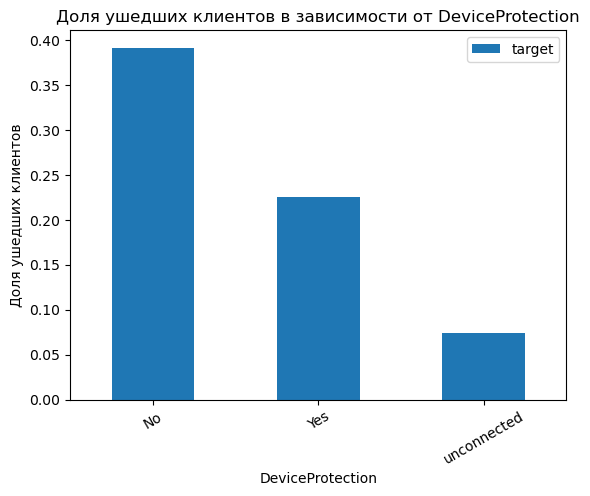

,target
TechSupport,
No,0.416355
Yes,0.151663
unconnected,0.074050


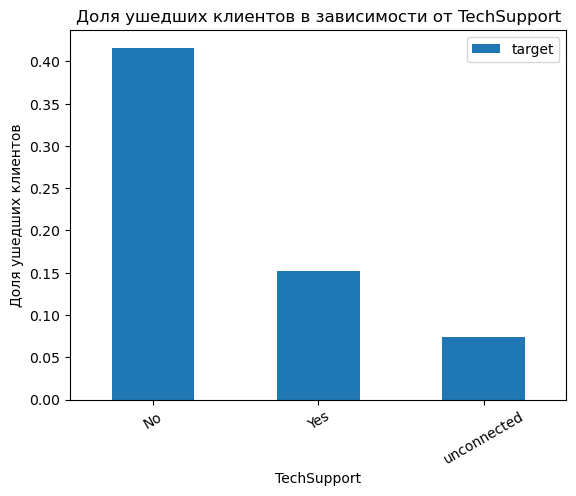

,target
StreamingTV,
No,0.335231
Yes,0.300702
unconnected,0.074050


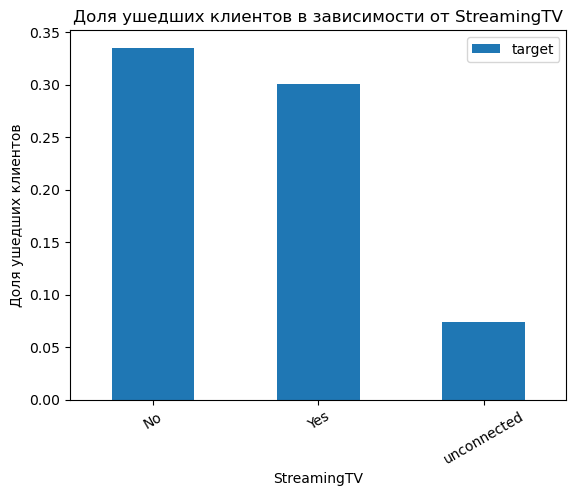

,target
StreamingMovies,
No,0.336804
Yes,0.299414
unconnected,0.074050


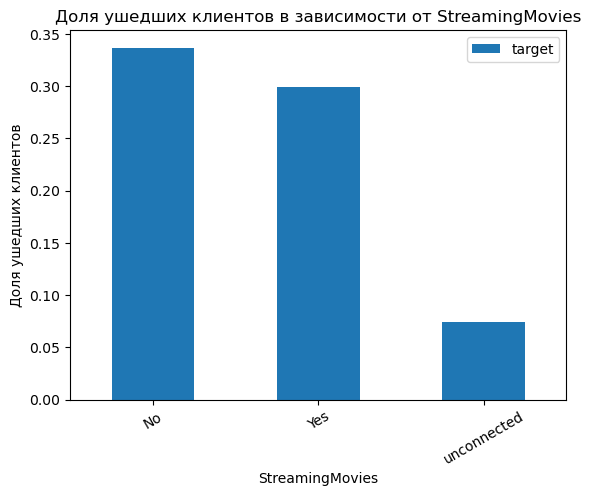

,target
MultipleLines,
No,0.250442
Yes,0.286099
unconnected,0.249267


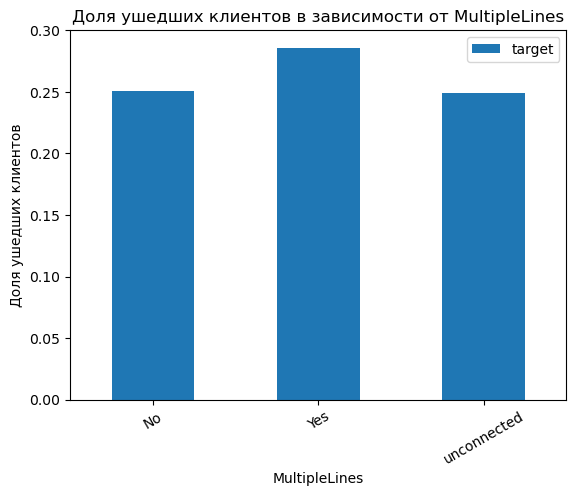

In [52]:
for i in cat_col:
    df = data.groupby(by=i).agg({'target': 'mean'})
    display(df)   
    df.plot(kind='bar');
    plt.ylabel('Доля ушедших клиентов')
    plt.title(f'Доля ушедших клиентов в зависимости от {i}')
    plt.xticks(rotation=30)
    plt.show();

Доля ушедших клиентов среди тех, кто оплачивате услуги каждый месяц заметно выше чем среди тех, кто опалчиват раз в год или два. Также среди тех, кто платит по электронному чеку доля ушедших больше чем для других форм оплаты. Нет значимой разницы между клиентами разного пола. Среди пенсионеров доля завершивших контракт также выше. Также как и среди неженатых и бездетных клиентов.

Стоит обратить внимание на то, что доля ушедших клиентов среди тех кто пользуется подключением через оптоволокно более чем в 2 раза выше чем при DSL. Заметно выше доля тех кто разрывает договор среди тех, кто не пользуется дополнительными интеренет услугами как OnlineSecurity (блокировка опасных сайтов), OnlineBackup (облачное хранилище файлов для резервного копирования данных), TechSupport (выделенная линия технической поддержки). Для клиентов, которые пользуются тв услугамии и услугами телефонии, разница не существенна.

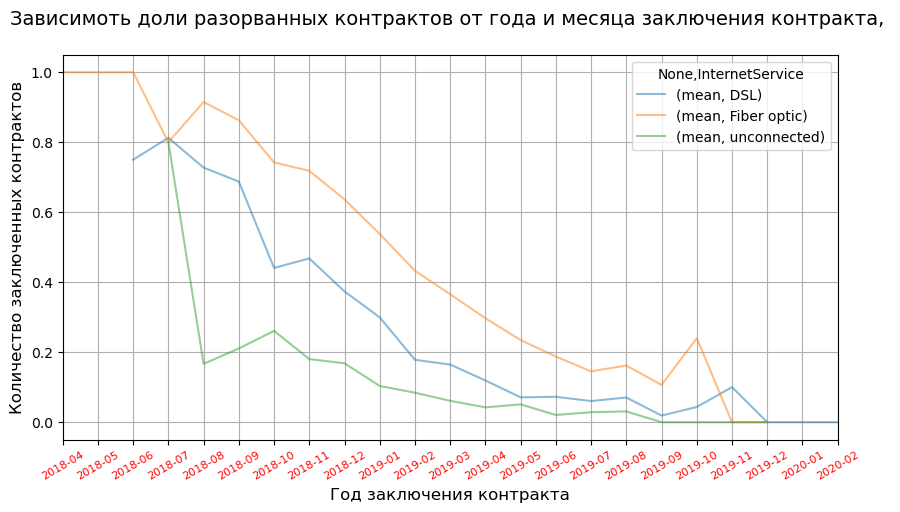

In [53]:
fig, ax = plt.subplots()
position_month = list(data["BeginDate"].dt.to_period("M").unique())
(
    data
    .pivot_table(index=data["BeginDate"].dt.to_period("M"), columns='InternetService', values='target', aggfunc=['mean'])
    .plot(grid=(True), style='-', alpha=0.5, figsize=(10, 5), ax=ax)
)

plt.xlabel('Год заключения контракта', fontsize=12)
plt.ylabel('Количество заключенных контрактов', fontsize=12)
plt.title('Зависимоть доли разорванных контрактов от года и месяца заключения контракта, \n', fontsize=14)
plt.legend=True
ax.set_xticks(position_month)
ax.set_xticklabels(list(data["BeginDate"].dt.to_period("M").unique()), size=8, c='red')
plt.xticks(rotation=30)
# ax.legend(["Количество заключенных контрактов"])
plt.show()

In [54]:
num_col

['MonthlyCharges', 'TotalCharges', 'duration', 'begin_year', 'begin_month']

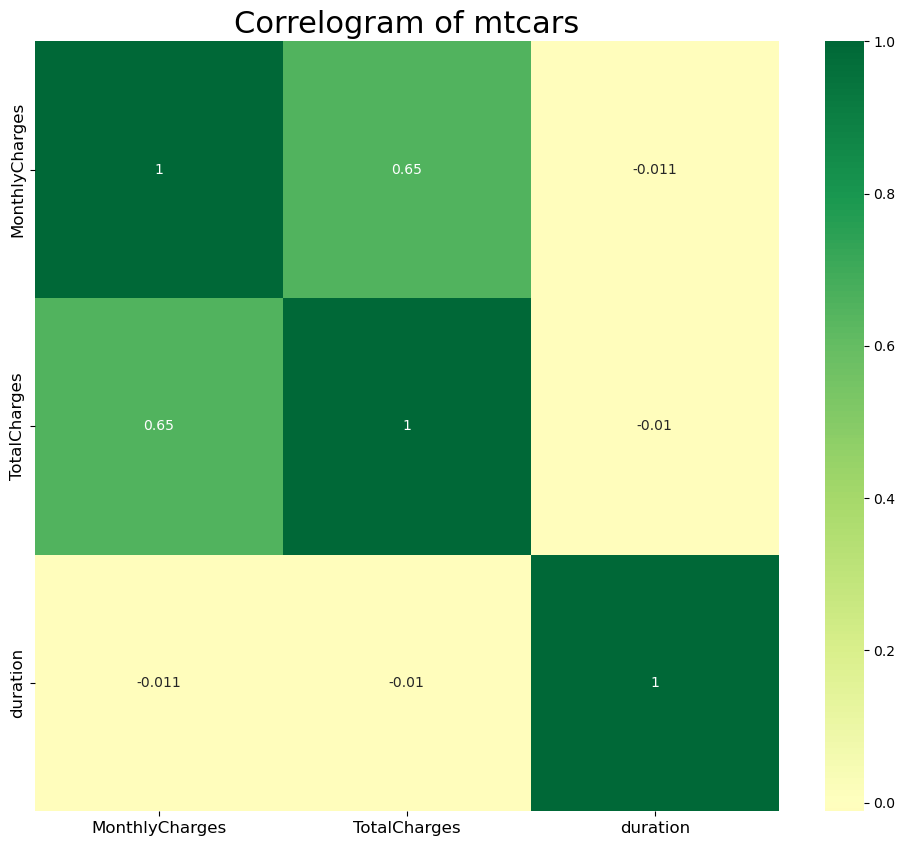

In [55]:
# Plot
plt.figure(figsize=(12,10))
sns.heatmap(data[['MonthlyCharges', 'TotalCharges', 'duration']].corr(), 
            xticklabels=data[['MonthlyCharges', 'TotalCharges', 'duration']].corr().columns, 
            yticklabels=data[['MonthlyCharges', 'TotalCharges', 'duration']].corr().columns, 

            cmap='RdYlGn', center=0, annot=True)

# Decorations
plt.title('Correlogram of mtcars', fontsize=22)
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()

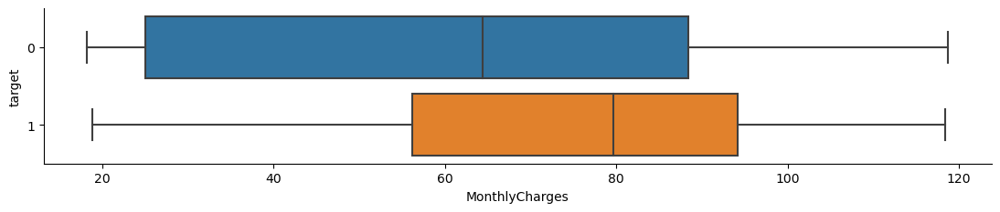

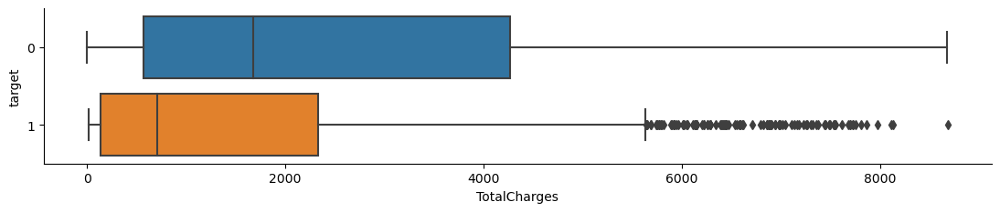

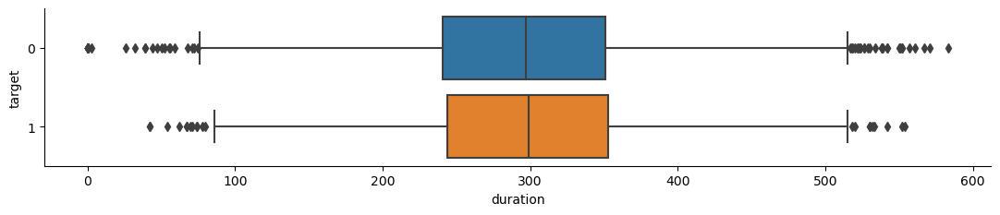

In [56]:
#Сравним показатели численных признаков
for column in ['MonthlyCharges', 'TotalCharges', 'duration']:    
    g = sns.catplot(y='target', x=column, kind="box", data= data, orient='h')
    g.fig.set_figwidth(12)
    g.fig.set_figheight(2)
    plt.show();

In [57]:
data[data['TotalCharges'] > data['TotalCharges'].quantile( .99)]

,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines,target,duration,begin_year,begin_month
customerID,,,,,,,,,,,,,,,,,,,,,,,
0017-IUDMW,2019-03-12,2020-02-01,Two year,Yes,Credit card (automatic),116.80,8456.75,Female,False,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Yes,0,326,2019,3
0106-UGRDO,2019-02-22,2020-02-01,Two year,Yes,Electronic check,116.00,8182.85,Female,False,Yes,No,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Yes,0,344,2019,2
0164-APGRB,2019-05-12,2020-02-01,Two year,Yes,Electronic check,114.90,8496.70,Female,False,No,No,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Yes,0,265,2019,5
0186-CAERR,2019-03-20,2020-02-01,One year,Yes,Bank transfer (automatic),116.30,8309.55,Male,False,No,No,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Yes,0,318,2019,3
0201-OAMXR,2018-12-13,2019-11-01,One year,No,Credit card (automatic),115.55,8127.60,Female,False,No,No,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Yes,1,323,2018,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9680-NIAUV,2019-01-08,2020-02-01,Two year,No,Credit card (automatic),109.70,8129.30,Female,False,Yes,Yes,Fiber optic,Yes,Yes,Yes,No,Yes,Yes,Yes,0,389,2019,1
9739-JLPQJ,2019-09-29,2020-02-01,Two year,No,Credit card (automatic),117.50,8670.10,Female,False,Yes,Yes,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Yes,0,125,2019,9
9788-HNGUT,2019-01-19,2020-02-01,Two year,Yes,Credit card (automatic),116.95,8594.40,Male,False,Yes,No,Fiber optic,Yes,Yes,Yes,Yes,Yes,Yes,Yes,0,378,2019,1


По боксплоту видно, что есть выбросы.

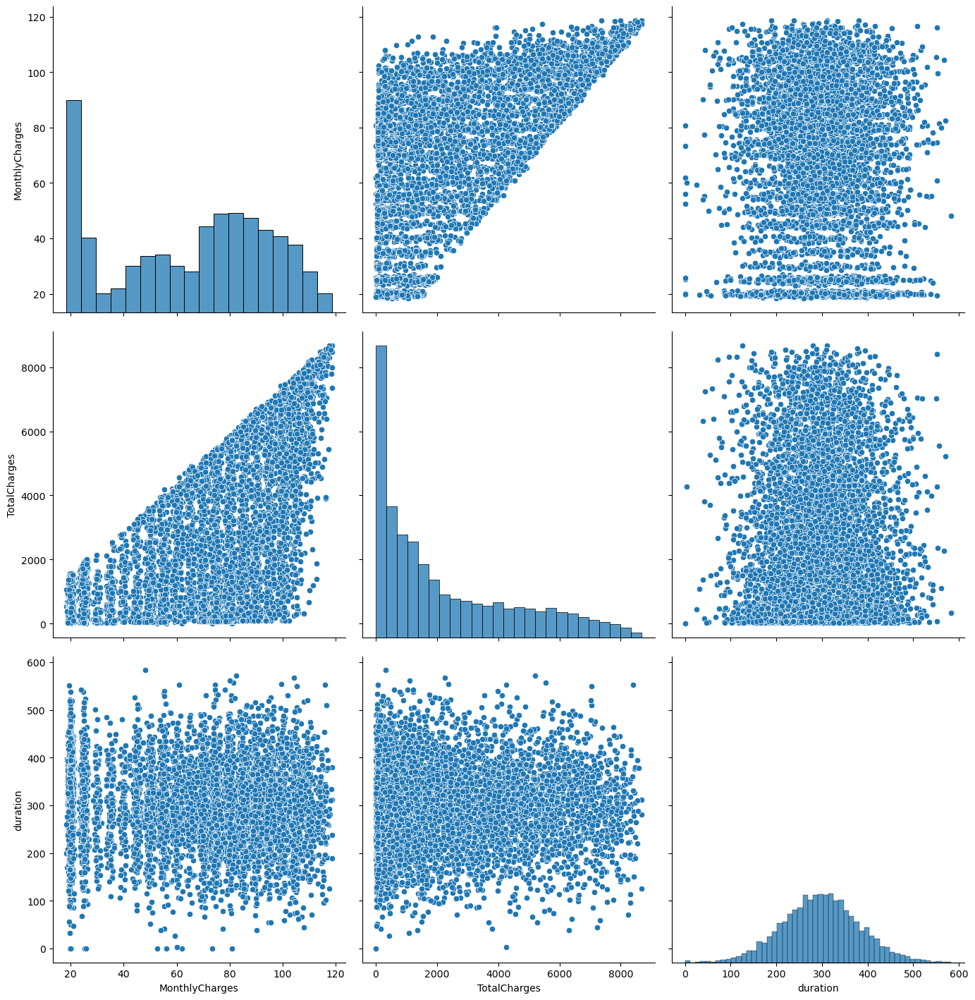

In [58]:
sns.pairplot(data[['MonthlyCharges', 'TotalCharges', 'duration']])
plt.gcf().set_size_inches(15,15);

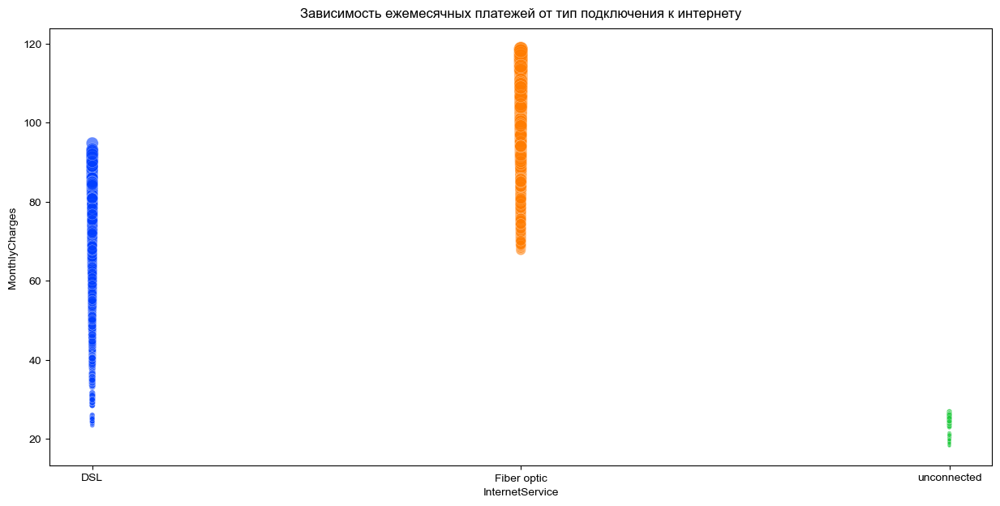

In [59]:
fig, ax = plt.subplots(figsize=(15, 7))
sns.scatterplot(data=data,
                x='InternetService',
                y='MonthlyCharges',
                hue='InternetService',
                size='MonthlyCharges',
                sizes=(10, 150),
                alpha=.6, 
                palette='bright',
                ax=ax,
                legend=False)
sns.set_style("whitegrid")
ax.tick_params(axis='x')
ax.set_title(
    'Зависимость ежемесячных платежей от тип подключения к интернету',
    fontsize=12,
    y=1.01)
plt.grid=True
plt.xticks(rotation=0)
plt.show()

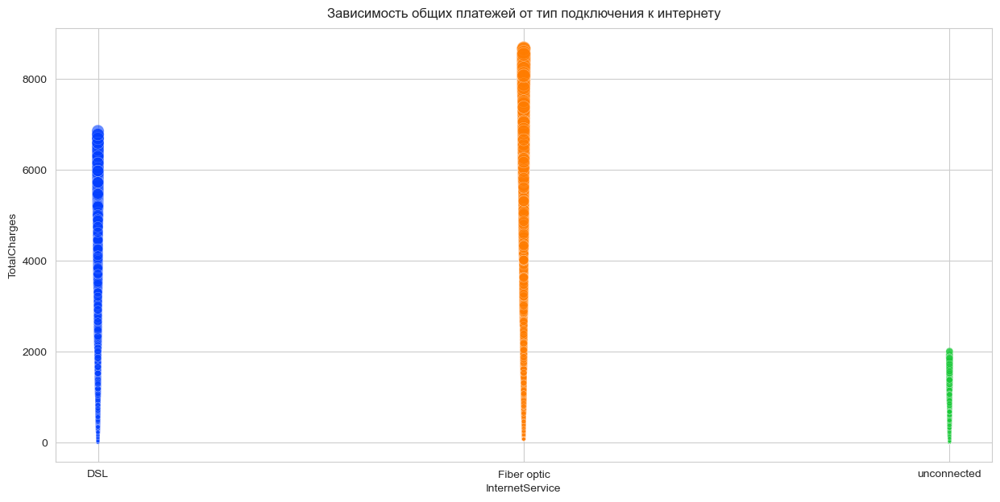

In [60]:
fig, ax = plt.subplots(figsize=(15, 7))
sns.scatterplot(data=data,
                x='InternetService',
                y='TotalCharges',
                hue='InternetService',
                size='TotalCharges',
                sizes=(10, 150),
                alpha=.6, 
                palette='bright',
                ax=ax,
                legend=False)
sns.set_style("whitegrid")
ax.tick_params(axis='x')
ax.set_title(
    'Зависимость общих платежей от тип подключения к интернету',
    fontsize=12,
    y=1.01)
plt.grid=True
plt.xticks(rotation=0)
plt.show()

Удалим лишние признаки: дату начала и окончания договора, а также длительность договора, так как мы не можем её использовать одновременно с годом и месяцем начала договора, из-за утечки данных.

In [61]:
data.drop(['BeginDate', 'EndDate', 'duration'], axis=1, inplace=True)
data.head()

,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines,target,begin_year,begin_month
customerID,,,,,,,,,,,,,,,,,,,,
0002-ORFBO,One year,Yes,Mailed check,65.6,593.30,Female,False,Yes,Yes,DSL,No,Yes,No,Yes,Yes,No,No,0,2019,2
0003-MKNFE,Month-to-month,No,Mailed check,59.9,542.40,Male,False,No,No,DSL,No,No,No,No,No,Yes,Yes,0,2018,11
0004-TLHLJ,Month-to-month,Yes,Electronic check,73.9,280.85,Male,False,No,No,Fiber optic,No,No,Yes,No,No,No,No,1,2019,4
0011-IGKFF,Month-to-month,Yes,Electronic check,98.0,1237.85,Male,True,Yes,No,Fiber optic,No,Yes,Yes,No,Yes,Yes,No,1,2019,4
0013-EXCHZ,Month-to-month,Yes,Mailed check,83.9,267.40,Female,True,Yes,No,Fiber optic,No,No,No,Yes,Yes,No,No,1,2019,3


Составим портрета клиента в виде таблицы, где укажем среднее значение численных признаков и моду категориальных признаков для ушедших и оставшихся клиентов.

In [62]:
col = ['MonthlyCharges', 'TotalCharges']
data_num_col = data.pivot_table(values=col, 
                 columns='target', 
                 aggfunc='mean')


col = ['Type',
       'PaperlessBilling',
       'PaymentMethod',
       'gender',
       'SeniorCitizen',
       'Partner',
       'Dependents',
       'InternetService',
       'OnlineSecurity',
       'OnlineBackup',
       'DeviceProtection',
       'TechSupport',
       'StreamingTV',
       'StreamingMovies',
       'MultipleLines',
       'begin_month',
       'begin_year']
data_cat_col = data.pivot_table(values=col, 
                 columns='target', 
                 aggfunc=pd.Series.mode)

df  = pd.concat([data_num_col, data_cat_col])
df.rename(columns = {0:'не отток', 1:'отток'}, inplace = True )
df

target,не отток,отток
MonthlyCharges,61.265124,74.441332
TotalCharges,2549.911442,1531.796094
Dependents,No,No
DeviceProtection,No,No
InternetService,DSL,Fiber optic
MultipleLines,No,Yes
OnlineBackup,Yes,No
OnlineSecurity,No,No
PaperlessBilling,Yes,Yes
Partner,Yes,No


**Вывод**

* Количество клиентов мужчин и женщин практически одинаковое. Большинство клиентов не являются пенсионерами. Почти одинаковое количество как женатых, так и не женатых клиентов. Клиентов, у которых есть дети почти в два раза меньше, чем тех, у кого детей нет.

* Клиентов, которые пользуются подключением к интернету через оптоволокно чуть больше чем DSL. Доля тех, кто не подключили услугу блокировки опасных сайтов, антивирус и выделенной линией технической поддержки чуть больше чем тех, кто подключил эти услуги.

* Примерно одинаковое количество клиентов подключены к нескольким или только к одной телефонным линиям.

* Чаще всего клиенты предпочитают оплачивать услуги каждый месяц и через электронный чек. Другие типы оплаты встречаются с одинаковой частотой.

* В признаке 'MonthlyCharges' - ежемесячный платёж, есть три пика. Очень много значений около 20, то есть низкий платёж. Также есть пик около 80.

* Видно, что распределение 'TotalCharges' - общие расходы абонента смещенно влево, то есть количество клиентов, которые остаются достаточно долго не много.

Также количество заключенных контрактов со временем снижается, тогда как количество закрытых договоров примерно одинаковое. Стоит отметить, что в датасете представлены договоры, заключенные начиная с 04-2018, тогда как первая дата расторжения договора 01-10-2019. Это происходит тогда, когда количество новых договоров уже на спаде.

В целом нормальное распределение в BeginDate выглядит странно. Похоже, на графике мы видим некий всплеск новых договоров. Пик приходится на март-апрель 2019-го. Вероятно, это следствие какой-нибудь акции.

Хорошо видно, что среднее значение ежемесячного платежа для новых договоров снижается.
Видна тенденция к росту общих платежей. Это объясняется тем, что приток новых клиентов очень невелик, и сумма платежей старых клиентов имеет большой вес в среднем значении общих трат. В начале и конце графика мы видим скачки медианы и среднего значения. Скорее всего это связано с небольшим количеством значений, когда каждое значение или выброс сильно влияет на среднее.

Видим, что больше всего клиентов разорвали договоры среди тех, кто заключил его в декабре 2018. Вспомним, что пик заключения новых договоров пришелся на март-апрель того же года. А вот доля разорванных контрактов снижается, то есть более новые контракты в среднем разрывают реже.


Подводя итог, можно выделить основные критерии «надёжного» клиента:  
* он заключил договор недавно, 
* оплачивает услуги раз в год или два, а не ежемесячно,
* оплачивает услуги кредитной картой или банковским переводом
* не является пенсионером
* женат и имеет детей
* подключен к интернету через DSL
* скорее всего пользуется дополнительными интернет сервисами, такими как блокировка опасных сайтов, (облачное хранилище файлов для резервного копирования данных, выделенная линия технической поддержки.

После анализа данных мы удалили лишние признаки: дату начала и окончания договора, а также длительность договора, так как мы не можем её использовать одновременно с годом и месяцем начала договора, из-за утечки данных.

## Разделениен на выборки

Разделим данные на обучающую и тестовую выборки. Поскольку есть дисбаланс классов и более старые договоры закрываются чаще и наши данные могут быть стратифицированны, установим параметр stratify по целевому признаку. Для того, чтобы модель имела равные возможности для изучения признаков каждого класса.

In [63]:
def split(df):

    target = df['target']
    features = df.drop(['target'], axis=1)
    
    features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, 
                                                                                random_state=RANDOM_STATE, 
                                                                                stratify=target,
                                                                                shuffle = True)
    print('Размер обучающей выборки:', features_train.shape[0], 'строк - ', round(features_train.shape[0]/df.shape[0] * 100), "%")
    print('Размер тестовой выборки:', features_test.shape[0], 'строк - ', round(features_test.shape[0]/df.shape[0] * 100), "%")
    return features_train, target_train, features_test, target_test

In [64]:
features_train, target_train, features_test, target_test = split(data);

Размер обучающей выборки: 5282 строк -  75 %
Размер тестовой выборки: 1761 строк -  25 %


In [65]:
cat_col, num_col, date_col = sep_col(features_train)

cat_col ['Type', 'PaperlessBilling', 'PaymentMethod', 'gender', 'SeniorCitizen', 'Partner', 'Dependents', 'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection', 'TechSupport', 'StreamingTV', 'StreamingMovies', 'MultipleLines']
num_col ['MonthlyCharges', 'TotalCharges', 'begin_year', 'begin_month']
date_col []


## Pipeline

Напишем пайплайн для предобработки данных для разных моделей. Для логистической регрессии и нейросети будем исполльзовать OHE и масштабирование, для моделей на основе деревьев только OrdinalEncoder.

In [66]:
col_transformer_oe = make_column_transformer(
    (
        OrdinalEncoder(handle_unknown='use_encoded_value', unknown_value=-1),
        cat_col
    ),
    remainder='passthrough'
)


col_transformer_ohe = make_column_transformer(
    (
        OneHotEncoder( drop='first', handle_unknown = 'ignore'), #, sparse=False
        cat_col
    ),
    (
        StandardScaler(),
        num_col
    ),
    remainder='passthrough'
)

## LogisticRegression

In [67]:
%%time

model_logreg = LogisticRegression(random_state = RANDOM_STATE)

CPU times: total: 0 ns
Wall time: 1 ms


In [68]:
pipeline_logreg = make_pipeline(col_transformer_ohe, model_logreg)
model_params = {
    'logisticregression__penalty': ['l1', 'l2', None],
    'logisticregression__solver': ['liblinear', 'lbfgs', 'saga']
}

In [69]:
gs_logreg = GridSearchCV(pipeline_logreg, model_params, cv=5, scoring='roc_auc')
gs_logreg.fit(features_train, target_train)
print('Параметры лучшей модели: \n', gs_logreg.best_params_, '\n')
print('Результат лучшей модели roc-auc: \n', gs_logreg.best_score_)

Параметры лучшей модели: 
 {'logisticregression__penalty': 'l1', 'logisticregression__solver': 'saga'} 

Результат лучшей модели roc-auc: 
 0.8861165316642122


In [70]:
gs_logreg.best_estimator_.steps[1][1]

LogisticRegression(penalty='l1', random_state=19032024, solver='saga')

In [71]:
col_transformer_ohe.fit(features_train)

# Применение преобразования ко всем данным
features_train_enc = col_transformer_ohe.transform(features_train)
features_test_enc = col_transformer_ohe.transform(features_test)

In [72]:
explainer = shap.Explainer(gs_logreg.best_estimator_.steps[1][1], features_train_enc)
shap_values = explainer.shap_values(features_train_enc)

In [73]:
feature_names = col_transformer_ohe.fit(features_train).get_feature_names_out()
feature_names

array(['onehotencoder__Type_One year', 'onehotencoder__Type_Two year',
       'onehotencoder__PaperlessBilling_Yes',
       'onehotencoder__PaymentMethod_Credit card (automatic)',
       'onehotencoder__PaymentMethod_Electronic check',
       'onehotencoder__PaymentMethod_Mailed check',
       'onehotencoder__gender_Male', 'onehotencoder__SeniorCitizen_True',
       'onehotencoder__Partner_Yes', 'onehotencoder__Dependents_Yes',
       'onehotencoder__InternetService_Fiber optic',
       'onehotencoder__InternetService_unconnected',
       'onehotencoder__OnlineSecurity_Yes',
       'onehotencoder__OnlineSecurity_unconnected',
       'onehotencoder__OnlineBackup_Yes',
       'onehotencoder__OnlineBackup_unconnected',
       'onehotencoder__DeviceProtection_Yes',
       'onehotencoder__DeviceProtection_unconnected',
       'onehotencoder__TechSupport_Yes',
       'onehotencoder__TechSupport_unconnected',
       'onehotencoder__StreamingTV_Yes',
       'onehotencoder__StreamingTV_unconnec

In [74]:
shap.summary_plot(shap_values, 
                  features_train_enc, 
                  feature_names=feature_names,
                  plot_type="bar",
                  plot_size=(10, 10), 
                  show=False)
plt.title("Важность признаков LogisticRegression \n", fontsize=18)
plt.xlabel('Важность признаков для модели', fontsize=12)
plt.ylabel('Список признаков', fontsize=12)
plt.show()

shap.summary_plot(shap_values, 
                  features_train_enc, 
                  feature_names=feature_names,
                  plot_size=(10, 10), 
                  show=False)
plt.title("Важность признаков LogisticRegression \n", fontsize=18)
plt.xlabel('Важность признаков для модели', fontsize=12)
plt.ylabel('Список признаков', fontsize=12)
plt.show()

## Random Forest

In [75]:
%%time

model_RF = RandomForestClassifier(random_state = RANDOM_STATE)
pipeline_RF = make_pipeline(col_transformer_oe, model_RF)

model_params = {
    'randomforestclassifier__n_estimators': [50, 100, 200, 300, 400],
    'randomforestclassifier__max_depth': [3, 6, 9, 12, 15]
}


gs_RF = GridSearchCV(pipeline_RF, model_params, cv=5, scoring='roc_auc')
gs_RF.fit(features_train, target_train)

print('Параметры лучшей модели: \n', gs_RF.best_params_, '\n')
print('Результат лучшей модели roc-auc: \n', gs_RF.best_score_)

Параметры лучшей модели: 
 {'randomforestclassifier__max_depth': 9, 'randomforestclassifier__n_estimators': 400} 

Результат лучшей модели roc-auc: 
 0.881698089350573
CPU times: total: 1min 17s
Wall time: 1min 17s


In [76]:
RF_imp = pd.Series(gs_RF.best_estimator_.steps[1][1].feature_importances_,
                         features_train.columns).sort_values()
fig, ax = plt.subplots(figsize=(16,7))
RF_imp.plot.bar(ax=ax)
ax.set_title("Важность признаков RandomForestClassifier")
ax.set_ylabel('Важность признака для модели, %')
ax.set_xlabel('Признаки')
fig.tight_layout()

## catboost

In [77]:
%%time

cat_features = cat_col

model_cat = CatBoostClassifier(random_state = RANDOM_STATE)


params = {
          'learning_rate': [0.001, 0.01, 0.1],
          'loss_function':['Logloss', 'CrossEntropy'],
          'depth': [6, 10],
          'l2_leaf_reg': [1, 5, 9]
}

gs_cat = GridSearchCV(estimator=model_cat, param_grid=params, scoring='roc_auc', cv=5, refit = True, n_jobs = -1)

gs_cat.fit(features_train, target_train, cat_features=cat_features, verbose=False)

print('Параметры лучшей модели: \n', gs_cat.best_params_, '\n')
print('Результат лучшей модели roc-auc: \n', gs_cat.best_score_)

Параметры лучшей модели: 
 {'depth': 6, 'l2_leaf_reg': 9, 'learning_rate': 0.01, 'loss_function': 'Logloss'} 

Результат лучшей модели roc-auc: 
 0.8894835091509915
CPU times: total: 2min 3s
Wall time: 41min 14s


In [78]:
cat_imp = pd.Series(gs_cat.best_estimator_.get_feature_importance(),
                         features_train.columns).sort_values()
fig, ax = plt.subplots(figsize=(16,7))
cat_imp.plot.bar(ax=ax)
ax.set_title("Важность признаков Catboost \n", fontsize=18)
ax.set_ylabel('Важность признака для модели, %', fontsize=12)
ax.set_xlabel('Признаки')
fig.tight_layout()

### LightGBM

In [79]:
model_lgbm = LGBMClassifier(random_state = RANDOM_STATE)

In [80]:
pipeline_lgbm = make_pipeline(col_transformer_oe, model_lgbm)
model_params = { 'lgbmclassifier__max_depth': range(3, 6, 2),
              'lgbmclassifier__n_estimators': range(100, 301, 50)}

In [81]:
%%time

grid_lgbm = GridSearchCV(pipeline_lgbm, model_params, cv=5, scoring='roc_auc')
grid_lgbm.fit(features_train, target_train)

print('Параметры лучшей модели: \n', grid_lgbm.best_params_, '\n')
print('Результат лучшей модели roc-auc: \n', grid_lgbm.best_score_)

[LightGBM] [Info] Number of positive: 1121, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4225, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265325 -> initscore=-1.018470
[LightGBM] [Info] Start training from score -1.018470
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Number of positive: 1122, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000210 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4226, number o

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Info] Number of positive: 1122, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000227 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4226, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265499 -> initscore=-1.017579
[LightGBM] [Info] Start training from score -1.017579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Info] Number of positive: 1121, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000186 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4225, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265325 -> initscore=-1.018470
[LightGBM] [Info] Start training from score -1.018470
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Info] Number of positive: 1122, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4226, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265499 -> initscore=-1.017579
[LightGBM] [Info] Start training from score -1.017579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Info] Number of positive: 1121, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000208 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4225, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265325 -> initscore=-1.018470
[LightGBM] [Info] Start training from score -1.018470
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1121, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4225, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265325 -> initscore=-1.018470
[LightGBM] [Info] Start training from score -1.018470
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1122, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4226, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265499 -> initscore=-1.017579
[LightGBM] [Info] Start training from score -1.017579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1122, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000201 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4226, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265499 -> initscore=-1.017579
[LightGBM] [Info] Start training from score -1.017579
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1121, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000167 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4225, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265325 -> initscore=-1.018470
[LightGBM] [Info] Start training from score -1.018470
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1122, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000207 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4226, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265499 -> initscore=-1.017579
[LightGBM] [Info] Start training from score -1.017579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1121, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4225, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265325 -> initscore=-1.018470
[LightGBM] [Info] Start training from score -1.018470
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1122, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000204 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4226, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265499 -> initscore=-1.017579
[LightGBM] [Info] Start training from score -1.017579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further spli

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1122, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000205 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4226, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265499 -> initscore=-1.017579
[LightGBM] [Info] Start training from score -1.017579
[LightGBM] [Warning] No further splits with positive gai

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1122, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000187 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set: 4226, number of used features: 19
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.265499 -> initscore=-1.017579
[LightGBM] [Info] Start training from score -1.017579
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warn

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Warning] Accuracy may be bad since you didn't explicitly set num_leaves OR 2^max_depth > num_leaves. (num_leaves=31).
[LightGBM] [Info] Number of positive: 1122, number of negative: 3104
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000206 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 568
[LightGBM] [Info] Number of data points in the train set:

[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
Параметры лучшей модели: 

In [82]:
grid_lgbm.best_estimator_.steps[1][1]

LGBMClassifier(max_depth=3, random_state=19032024)

## Нейросеть

In [83]:
col_transformer_ohe.fit(features_train)

ColumnTransformer(remainder='passthrough',
                  transformers=[('onehotencoder',
                                 OneHotEncoder(drop='first',
                                               handle_unknown='ignore'),
                                 ['Type', 'PaperlessBilling', 'PaymentMethod',
                                  'gender', 'SeniorCitizen', 'Partner',
                                  'Dependents', 'InternetService',
                                  'OnlineSecurity', 'OnlineBackup',
                                  'DeviceProtection', 'TechSupport',
                                  'StreamingTV', 'StreamingMovies',
                                  'MultipleLines']),
                                ('standardscaler', StandardScaler(),
                                 ['MonthlyCharges', 'TotalCharges',
                                  'begin_year', 'begin_month'])])

In [84]:
# Применение преобразования ко всем данным
X_train_enc = col_transformer_ohe.transform(features_train)
X_test_enc = col_transformer_ohe.transform(features_test)

In [85]:
# Преобразование в тензоры PyTorch
X_train = torch.FloatTensor(X_train_enc)
X_test = torch.FloatTensor(X_test_enc)
y_train = torch.FloatTensor(target_train.values).reshape(-1, 1)
y_test = torch.FloatTensor(target_test.values).reshape(-1, 1)

In [86]:
X_train.size()[1]

30

In [87]:
# PyTorch classifier
class NetClassifier(nn.Module):
    def __init__(self, 
                 activation_1=nn.Sigmoid, 
                 activation_2=nn.Sigmoid, 
                 activation_3=nn.Sigmoid, 
                 n_neurons_1=20, 
                 n_neurons_2=5):
        super().__init__()
        self.layer1 = nn.Linear(X_train.size()[1], n_neurons_1)
        self.act1 = activation_1()
        self.layer2 = nn.Linear(n_neurons_1, n_neurons_2)
        self.act2 = activation_2()
        self.output = nn.Linear(n_neurons_2, 1)
        self.prob = activation_3()
 
    def forward(self, x):
        x = self.act1(self.layer1(x))
        x = self.act2(self.layer2(x))
        x = self.prob(self.output(x))
        return x

In [88]:
# create model with skorch
model_net = NeuralNetClassifier(
    NetClassifier,
    criterion=nn.BCELoss,
    optimizer=optim.Adam,
    verbose=False
)

In [89]:
# define the grid search parameters
param_grid = {
    'batch_size': [200],
    'max_epochs': [1000],
    'module__activation_1': [nn.ReLU, nn.Tanh, nn.Sigmoid],
    'module__activation_2': [nn.ReLU, nn.Tanh, nn.Sigmoid],
    'module__activation_3': [nn.ReLU, nn.Tanh, nn.Sigmoid],
    'optimizer__lr': [ 2e-2, 1e-3],
    'module__n_neurons_1': [10, 20],
    'module__n_neurons_2': [5, 10]
}

In [90]:
%%time
grid = GridSearchCV(estimator=model_net, param_grid=param_grid, n_jobs=-1, cv=5, scoring='roc_auc')
grid_result = grid.fit(X_train, y_train)

CPU times: total: 10min 4s
Wall time: 1h 9min 26s


In [91]:
grid_result.best_params_

{'batch_size': 200,
 'max_epochs': 1000,
 'module__activation_1': torch.nn.modules.activation.Sigmoid,
 'module__activation_2': torch.nn.modules.activation.ReLU,
 'module__activation_3': torch.nn.modules.activation.Sigmoid,
 'module__n_neurons_1': 10,
 'module__n_neurons_2': 5,
 'optimizer__lr': 0.001}

In [92]:
grid_result.best_score_

0.8832986644322036

## Финальный отчёт

In [93]:
final_report = pd.DataFrame({'model_name': ['LogisticRegression', 'Random Forest', 'Catboost', 'LightGBM', 'Neural_net'],
                            'best_score': [gs_logreg.best_score_, gs_RF.best_score_, gs_cat.best_score_,grid_lgbm.best_score_, grid_result.best_score_]})

In [94]:
final_report

,model_name,best_score
0,LogisticRegression,0.886117
1,Random Forest,0.881698
2,Catboost,0.889484
3,LightGBM,0.887170
4,Neural_net,0.883299


**Вывод**

Мы разделили данные на обучающую и тестовую выборки. Поскольку есть дисбаланс классов и более старые договоры закрываются чаще и наши данные могут быть стратифицированы, установили параметр stratify по целевому признаку. Для того, чтобы модель имела равные возможности для изучения признаков каждого класса.

Написали пайплайн для предобработки данных для разных моделей. Для логистической регрессии и нейросети использовали OHE и масштабирование, для моделей на основе деревьев только OrdinalEncoder.

Мы обучили модели логистической регрессии, случайного леса, catboost, LightGBM и нейронную сеть. Лучший результат на кроссвалидации показал модель catboost. Получим метрику roc-auc на тестовой выборке.

## Тестирование модели

In [95]:
### Функция для оценки результатов на тесте

def get_report(target_test, predictions, probabilities_test):
    report = classification_report(target_test, predictions, target_names=['контракт не разорван', 'контракт разорван'])
    print(report)
    
    confusion_matrix = pd.crosstab(target_test, predictions, rownames=['Истинные значения'], colnames=['Предсказания'])
    display(confusion_matrix)
    fig, ax = plt.subplots(figsize=(6, 6))
    sns.heatmap(confusion_matrix, annot=True, cmap="YlGnBu");

    probabilities_one_test = probabilities_test[:, 1]
    auc_roc = roc_auc_score(target_test, probabilities_one_test)
    print('Метрика auc_roc', round(auc_roc, 2))
    
    fpr, tpr, tresholds = roc_curve(target_test, probabilities_one_test)
    plt.figure(figsize=(5, 5))
    plt.plot(fpr, tpr, linestyle='-')
    plt.plot([0,1], [0,1], linestyle='-')
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC-кривая')
    plt.show()

In [96]:
predictions_cat = gs_cat.predict(features_test)
probabilities_test_cat = gs_cat.predict_proba(features_test)

probabilities_one_test = probabilities_test_cat[:, 1]
auc_roc = roc_auc_score(target_test, probabilities_one_test)
print('Метрика auc_roc', auc_roc)

Метрика auc_roc 0.8757384601636939


In [97]:
f1_score(target_test, predictions_cat)

0.6346604215456675

In [98]:
get_report(target_test, predictions_cat, probabilities_test_cat)

                      precision    recall  f1-score   support

контракт не разорван       0.86      0.91      0.88      1294
   контракт разорван       0.70      0.58      0.63       467

            accuracy                           0.82      1761
           macro avg       0.78      0.75      0.76      1761
        weighted avg       0.82      0.82      0.82      1761



Предсказания,0,1
Истинные значения,,
0,1178,116
1,196,271


Метрика auc_roc 0.88


In [99]:
accuracy_score(target_test, predictions_cat)

0.8228279386712095

In [100]:
precision_score(target_test, predictions_cat)

0.7002583979328165

In [101]:
target_test.value_counts()

target
0    1294
1     467
Name: count, dtype: int64

Для оценки адекватности модели создадим моель, которая предсказывает константу: класс 1 - клиент поканил компанию.

In [102]:
dummy_clf = DummyClassifier(strategy='constant', constant=1)
dummy_clf.fit(features_train, target_train)
dummy_clf.predict(features_test)

print('Метрика accuracy dummy модели:', (accuracy_score(target_test, dummy_clf.predict(features_test))))
print('Метрика f1 dummy модели:', f1_score(target_test, dummy_clf.predict(features_test)))
print('Метрика precision dummy модели:', precision_score(target_test, dummy_clf.predict(features_test)))
print('Метрика recall dummy модели:', recall_score(target_test, dummy_clf.predict(features_test)))
print('Метрика auc_roc dummy модели', roc_auc_score(target_test, dummy_clf.predict_proba(features_test)[:, 1]))

Метрика accuracy dummy модели: 0.26519023282226006
Метрика f1 dummy модели: 0.41921005385996407
Метрика precision dummy модели: 0.26519023282226006
Метрика recall dummy модели: 1.0
Метрика auc_roc dummy модели 0.5


**Вывод**

Рассмотрим подробнее результаты лучшей модели. Посмотрим на матрицу ошибок. Правильные ответы преобладают. Больше всего допущенных ошибок типа False-negative, таких 202. Это значит, что модель не выявила 202 клиента, которые отказались от услуг компании. Ошибки типа False-positive модель совершила 110 раз. Это значит, что в 110 случаях из 1294 модель порекомендует предложить более выгодняе условия контракта клиентам, которые и так не собирались закрывать контракт.

Для оценки адекватности лучшей модели получим бэйзлайн. Используем DummyClassifier для предсказания константы.

* Значение precision - точность определение класса:
precision показывает долю клиентов, которых модель посчитала "уходящими" и они действительно ушли.
precision = 0.71 означает, что из 100 клиентов определенных моделью как "уходящих" 71 клиент действительно ушёл.

* Значение recall - полнота определение класса:
recall в 0.57 означает, что из 100 клиентов, которые действительно ушли модель правильно определит 57 человек.

* Значение f1_score - среднее гармоническое значение точности и полноты:
f1_score = 0.63 учитывает одновременно метрики recall и precision

* Значение accuracy - отношение количества правильных ответов к общему числу ответов:
accuracy_score = 0.82, значит, что для 82 клиентов из 100 будет верно определно намериние уйти или остаться.

Видно, что каждая из метрик нашей модели значительно лучше чем у константной моедли. За исключение recall, потому что разумеется все клиенты были определены константной моделью как "ушедшие".

Наиболее важными признаками для модели catboost оказался признак Type. Посмотрим ещё раз зависимость доли ушедших клиентов относительно типа оплаты услуг.

In [103]:
df = data.groupby(by='Type').agg({'target': 'mean'})
display(df)   
df.plot(kind='bar');
plt.ylabel('Доля ушедших клиентов')
plt.title(f'Доля ушедших клиентов в зависимости от Type')
plt.xticks(rotation=30)
plt.show();

df.plot(kind='bar');
plt.ylabel('Количество ушедших клиентов')
plt.title(f'Количество ушедших клиентов в зависимости от Type')
plt.xticks(rotation=30)
plt.show();

,target
Type,
Month-to-month,0.427097
One year,0.112695
Two year,0.028319


**Вывод**

На тествой выборке метрика auc_roc составила 0.88.

Наиболее важными признаками для модели catboost оказался признак Type. Клиенты, которые предпочитают оплачивать услуги ежемесячно, а не раз в год-два, более склонны уходить. При этом надо заметить, что таких клиентов большинство.

## Общий вывод

**Задача**

Оператор связи «ТелеДом» хочет бороться с оттоком клиентов. Для этого его сотрудники начнут предлагать промокоды и специальные условия всем, кто планирует отказаться от услуг связи. Чтобы заранее находить таких пользователей, «ТелеДому» нужна модель, которая будет предсказывать, разорвёт ли абонент договор. Команда оператора собрала персональные данные о некоторых клиентах, информацию об их тарифах и услугах. Наша задача была — обучить на этих данных модель для прогноза оттока клиентов.


**Загрузка данных**

Мы загрузили данные их 4-х датафреймов:

Датафрейм contract содержит 7043 строк, 8 столбцов. В столбце EndDate только 1869 объектов, то есть 73.5% пропусков. В `TotalCharges` 0.2% пропусков. В остальных данных пропусков нет.

Есть разные типы данных:

`MonthlyCharges` и `TotalCharges` - численный тип;

`BeginDate` и `EndDate` - мы привели к типу datetime.

Даты заключения договоров в `BeginDate` начинаются с 2019-10-01. последняя дата заключения договора - 2020-01-01, что соответсвует дате выгрузки датасета.

Все идентификаторы пользователей `customerID` уникальны. Дубликатов нет. `EndDate` содержит дату завершения контракта с пользователем. Пропуски в столбце `EndDate` означают, что контракт с пользователем не завершён. На базе этого признака мы и составим целевой признак.

Датафрейм personal содержит 7043 строк, 5 столбцов. Пропусков в данных нет.

Есть разные типы данных:

`SeniorCitizen` - численный тип;

Остальные - текстового типа.

Все идентификаторы пользователей `customerID` уникальны. Дубликатов нет.

Датафрейм internet содержит 5517 строк, 8 столбцов. Пропусков в данных нет. Все текстового типа. Все идентификаторы пользователей `customerID` уникальны. Дубликатов нет. Строк меньше чем в personal и contract. Это говорит о том, что не все пользователи пользуются услугами интернета.

Датафрейм phone содержит 6361 строк, 2 столбца. Пропусков в данных нет. Все идентификаторы пользователей `customerID` уникальны. Дубликатов нет. Строк меньше чем в personal и contract. Это говорит о том, что не все пользователи пользуются услугами телефонии.


**Предобработка данных**

Мы объединили все датафремы по ID пользователя и выделили целевой признак. Создали новые признаки: год начала контракта, месяц начала контракта, длительность контракта. Для тех контрактов, которые не были завершены мы посчитали длительность относительно даты выгрузки датасета.
Мы сохранили все строки при объединении, поэтому получили много пропусков для тех клиетов, которые пользовались только одним сервисом: либо интеренетом, либо телефонией. Такие пропуски мы заполнили значением 'unconnected'. Пропуски в `TotalCharges` есть для тех контрактов, которые были заключены в день выгрузки данных. Их мы заполнили 0.
Хорошо виден дисбаланс классов. Стоит учитывать этот момент при построении модели.


**Исследовательский анализ**

* Количество клиентов мужчин и женщин практически одинаковое. Большинство клиентов не являются пенсионерами. Почти одинаковое количество как женатых, так и не женатых клиентов. Клиентов, у которых есть дети почти в два раза меньше, чем тех, у кого детей нет.

* Клиентов, которые пользуются подключением к интернету через оптоволокно чуть больше чем DSL. Доля тех, кто не подключили услугу блокировки опасных сайтов, антивирус и выделенной линией технической поддержки чуть больше чем тех, кто подключил эти услуги.

* Примерно одинаковое количество клиентов подключены к нескольким или только к одной телефонным линиям.

* Чаще всего клиенты предпочитают оплачивать услуги каждый месяц и через электронный чек. Другие типы оплаты встречаются с одинаковой частотой.

* В признаке 'MonthlyCharges' - ежемесячный платёж, есть три пика. Очень много значений около 20, то есть низкий платёж. Также есть пик около 80.

* Видно, что распределение 'TotalCharges' - общие расходы абонента смещенно влево, то есть количество клиентов, которые остаются достаточно долго не много.

Также количество заключенных контрактов со временем снижается, тогда как количество закрытых договоров примерно одинаковое. Стоит отметить, что в датасете представлены договоры, заключенные начиная с 04-2018, тогда как первая дата расторжения договора 01-10-2019. Это происходит тогда, когда количество новых договоров уже на спаде.

В целом нормальное распределение в BeginDate выглядит странно. Похоже, на графике мы видим некий всплеск новых договоров. Пик приходится на март-апрель 2019-го. Вероятно, это следствие какой-нибудь акции.

Хорошо видно, что среднее значение ежемесячного платежа для новых договоров снижается.
Видна тенденция к росту общих платежей. Это объясняется тем, что приток новых клиентов очень невелик, и сумма платежей старых клиентов имеет большой вес в среднем значении общих трат. В начале и конце графика мы видим скачки медианы и среднего значения. Скорее всего это связано с небольшим количеством значений, когда каждое значение или выброс сильно влияет на среднее.

Видим, что больше всего клиентов разорвали договоры среди тех, кто заключил его в декабре 2018. Вспомним, что пик заключения новых договоров пришелся на март-апрель того же года. А вот доля разорванных контрактов снижается, то есть более новые контракты в среднем разрывают реже.

Подводя итог, можно выделить основные критерии «надёжного» клиента:  
* он заключил договор недавно, 
* оплачивает услуги раз в год или два, а не ежемесячно,
* оплачивает услуги кредитной картой или банковским переводом
* е является пенсионером
* женат и имеет детей
* подключен к интернету через DSL
* скорее всего пользуется дополнительными интернет сервисами, такими как блокировка опасных сайтов, (облачное хранилище файлов для резервного копирования данных, выделенная линия технической поддержки.


**Обучение моделей**

Мы разделили данные на обучающую и тестовую выборки. Поскольку есть дисбаланс классов и более старые договоры закрываются чаще и наши данные могут быть стратифицированы, установили параметр stratify по целевому признаку. Для того, чтобы модель имела равные возможности для изучения признаков каждого класса.

Написали пайплайн для предобработки данных для разных моделей. Для логистической регрессии и нейросети использовали OHE и масштабирование, для моделей на основе деревьев только OrdinalEncoder.

Мы обучили модели логистической регрессии, случайного леса, catboost, LightGBM и нейронную сеть. Лучший результат на кроссвалидации показал модель catboost. Получим метрику roc-auc на тестовой выборке.


**Тестирование модели**

На тествой выборке метрика auc_roc составила 0.88.

Для оценки адекватности модели мы создали модель DummyClassifier, которая предсказывает константу: класс 1 - клиент поканил компанию. Согласно матрице ошибок правильные ответы преобладают. Больше всего допущенных ошибок типа False-negative, таких 202. Это значит, что модель не выявила 202 клиента, которые отказались от услуг компании. Ошибки типа False-positive модель совершила 110 раз. Это значит, что в 110 случаях из 1294 модель порекомендует предложить более выгодняе условия контракта клиентам, которые и так не собирались закрывать контракт.

* Значение precision - точность определение класса:
precision показывает долю клиентов, которых модель посчитала "уходящими" и они действительно ушли.
precision = 0.71 означает, что из 100 клиентов определенных моделью как "уходящих" 71 клиент действительно ушёл.

* Значение recall - полнота определение класса:
recall в 0.57 означает, что из 100 клиентов, которые действительно ушли модель правильно определит 57 человек.

* Значение f1_score - среднее гармоническое значение точности и полноты:
f1_score = 0.63 учитывает одновременно метрики recall и precision

* Значение accuracy - отношение количества правильных ответов к общему числу ответов:
accuracy_score = 0.82, значит, что для 82 клиентов из 100 будет верно определно намериние уйти или остаться.

Видно, что каждая из метрик нашей модели значительно лучше чем у константной моедли. За исключение recall, потому что разумеется все клиенты были определены константной моделью как "ушедшие".

Наиболее важными признаками для модели catboost оказался признак Type. Клиенты, которые предпочитают оплачивать услуги ежемесячно, а не раз в год-два, более склонны уходить. При этом надо заметить, что таких клиентов большинство.


**Рекомендации**

По итогам исследовательского анализа и работы модели можно дать следующие рекомендации:
* стараться привлекать больше новых клиентов
* семейных клиентов с детьми
* развивать подключение к интернету через DSL, возможно переводить на DSL старых клиентов
* стоит предлагать более выгодные тарифы для клиентов, которые оплачивают услуги раз в год или два, таких клиентов всё равно будет не очень много, но они наиболее надежные
* для наиболее старых клиентов предлагать обновленные, более привлекательные пакеты услуг, особенно обратить внимание на большую группу клиентов, которые заключили договоры в декабре 2019 года.